
# **Kelompok Duke Leto**
## Anggota Kelompok :
- 1121055 Mena Nababan
- 1122001 Nico Jonathan Setiawan
- 1122006 Jason Enrico
- 1122014 Mikael Alexander Gunawan
- 1122015 Gregorius Reza
- 1222017 Marcel Andrean
- 1122052 Nathanael Timotius Sutedja

# Import Library

In [ ]:
!pip install ydata-profiling

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 357.9/357.9 kB 7.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.8/104.8 kB 14.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 686.1/686.1 kB 15.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 293.3/293.3 kB 14.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 17.5 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27080 sha256=c459a71ed539bd9d6eb43c790b2784adc3638740bc45f2f0ad7282d505183157
  Stored in directory: /root/.cache/pip/wheels/dd/91/29/a79cecb328d01739e64017b6fb9a1ab9d8cb1853098ec5966d
Successfully built htmlmin
  Attempting uninstall: seaborn
    Found existing installation: seaborn 0.13.1
    Uninstalling seaborn-0.13.1:
      Successfully uninstalled seaborn-0.13.1


In [ ]:
import pandas as pd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2
#import pandas_profiling
from ydata_profiling import ProfileReport
from sklearn.preprocessing import LabelEncoder
from scipy import stats
sns.set()

In [ ]:
import warnings
warnings.filterwarnings("ignore")

## **Import Data**

## Estimation of Obesity Levels Based On Eating Habits and Physical Condition

SOURCE: https://archive.ics.uci.edu/dataset/544/estimation+of+obesity+levels+based+on+eating+habits+and+physical+condition

In [ ]:
data=pd.read_csv('Obesity Dataset.csv')

In [ ]:
copy_data = data.copy()

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2111 entries, 0 to 2110
Data columns (total 17 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   Gender                          2111 non-null   object 
 1   Age                             2111 non-null   float64
 2   Height                          2111 non-null   float64
 3   Weight                          2111 non-null   float64
 4   family_history_with_overweight  2111 non-null   object 
 5   FAVC                            2111 non-null   object 
 6   FCVC                            2111 non-null   float64
 7   NCP                             2111 non-null   float64
 8   CAEC                            2111 non-null   object 
 9   SMOKE                           2111 non-null   object 
 10  CH2O                            2111 non-null   float64
 11  SCC                             2111 non-null   object 
 12  FAF                             21

In [ ]:
label = data.columns
label

Index(['Gender', 'Age', 'Height', 'Weight', 'family_history_with_overweight',
       'FAVC', 'FCVC', 'NCP', 'CAEC', 'SMOKE', 'CH2O', 'SCC', 'FAF', 'TUE',
       'CALC', 'MTRANS', 'NObeyesdad'],
      dtype='object')

- ### Gender: Features. Explains the subject's gender (Categorical Value: "Female" or "Male")

- ### Age: Features. Explain the subject's age (Numerical Value)

- ### Height: Features. Explain the subject's height in meters (Numerical Value)

- ### Weight: Features. Explain the subject's weight in kilograms (Numerical Value)

- ### Family Member Suffers from Overweight: Features. Explains whether the subject has a family member that suffers from being Overweight (Categorical Value: "Yes" or "No")

- ### FAVC: Features. Frequent consumption of High Caloric Food, explains whether the subject eats high-caloric food frequently or not (Categorical Value: "Yes" or "No")

- ### FCVC: Features. Frequency of consumption of vegetables, explains whether the subject usually eats vegetables in their meals (Categorical Value: "Never", "Sometimes" or "Always")

- ### NCP: Features. Number of main meals, explains how many main meals the subject has daily (Categorical Value: "Between 1 y 2", "Three" or "More than three")

- ### CAEC: Features. Consumption of food between meals, explains how frequently the subject eats any food between their meals (Categorical Value: "No", "Sometimes", "Frequently" or "Always")

- ### SMOKE: Features. Explains if the subject smokes or not (Categorical Value: "Yes" or "No")

- ### CH2O: Features. Consumption of water daily, explains how much water the subject drinks daily (Categorical Value: "Less than a liter", "Between 1 and 2L" or "More than 2L")

- ### SCC: Features. Calorie consumption monitoring, explains if the subject monitors their calorie intake daily (Categorical Value: "Yes" or "No")

- ### FAF: Features. Physical activity frequency, explains how often the subject has physical activity (Categorical Value: "I do not have", "1 or 2 days", "2 or 4 days" or "4 or 5 days")

- ### TUE: Features. Time using technology devices explains how much time the subject uses technological devices (Categorical Value: "0-2 hours", "3-5 hours" or "More than 5 hours")

- ### CALC: Features. Consumption of alcohol, explains how often the subject drinks alcohol (Categorical Value: "I do not drink", "Sometimes", "Frequently" or "Always")

- ### MTRANS: Features. Transportation used explains which transportation does the subject usually use (Categorical Value: "Automobile", "Motorbike", "Bike", "Public Transportation" or "Walking")

- ### NObeyesdad: Target. The target feature that explains if the subject has obesity or not and puts them in a categorical bin (Categorical Value: "Insufficient weight", "Normal Weight", "Overweight Level I", "Overweight Level II", "Obesity Type I", "Obesity Type II" or "Obesity Type III")```

## **Data Profiling**

In [ ]:
data

,Gender,Age,Height,Weight,family_history_with_overweight,FAVC,FCVC,NCP,CAEC,SMOKE,CH2O,SCC,FAF,TUE,CALC,MTRANS,NObeyesdad
0,Female,21.000000,1.620000,64.000000,yes,no,2.0,3.0,Sometimes,no,2.000000,no,0.000000,1.000000,no,Public_Transportation,Normal_Weight
1,Female,21.000000,1.520000,56.000000,yes,no,3.0,3.0,Sometimes,yes,3.000000,yes,3.000000,0.000000,Sometimes,Public_Transportation,Normal_Weight
2,Male,23.000000,1.800000,77.000000,yes,no,2.0,3.0,Sometimes,no,2.000000,no,2.000000,1.000000,Frequently,Public_Transportation,Normal_Weight
3,Male,27.000000,1.800000,87.000000,no,no,3.0,3.0,Sometimes,no,2.000000,no,2.000000,0.000000,Frequently,Walking,Overweight_Level_I
4,Male,22.000000,1.780000,89.800000,no,no,2.0,1.0,Sometimes,no,2.000000,no,0.000000,0.000000,Sometimes,Public_Transportation,Overweight_Level_II
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2106,Female,20.976842,1.710730,131.408528,yes,yes,3.0,3.0,Sometimes,no,1.728139,no,1.676269,0.906247,Sometimes,Public_Transportation,Obesity_Type_III
2107,Female,21.982942,1.748584,133.742943,yes,yes,3.0,3.0,Sometimes,no,2.005130,no,1.341390,0.599270,Sometimes,Public_Transportation,Obesity_Type_III
2108,Female,22.524036,1.752206,133.689352,yes,yes,3.0,3.0,Sometimes,no,2.054193,no,1.414209,0.646288,Sometimes,Public_Transportation,Obesity_Type_III
2109,Female,24.361936,1.739450,133.346641,yes,yes,3.0,3.0,Sometimes,no,2.852339,no,1.139107,0.586035,Sometimes,Public_Transportation,Obesity_Type_III


In [ ]:
data.dtypes

Gender                             object
Age                               float64
Height                            float64
Weight                            float64
family_history_with_overweight     object
FAVC                               object
FCVC                              float64
NCP                               float64
CAEC                               object
SMOKE                              object
CH2O                              float64
SCC                                object
FAF                               float64
TUE                               float64
CALC                               object
MTRANS                             object
NObeyesdad                         object
dtype: object

In [ ]:
data.head()

,Gender,Age,Height,Weight,family_history_with_overweight,FAVC,FCVC,NCP,CAEC,SMOKE,CH2O,SCC,FAF,TUE,CALC,MTRANS,NObeyesdad
0,Female,21.0,1.62,64.0,yes,no,2.0,3.0,Sometimes,no,2.0,no,0.0,1.0,no,Public_Transportation,Normal_Weight
1,Female,21.0,1.52,56.0,yes,no,3.0,3.0,Sometimes,yes,3.0,yes,3.0,0.0,Sometimes,Public_Transportation,Normal_Weight
2,Male,23.0,1.80,77.0,yes,no,2.0,3.0,Sometimes,no,2.0,no,2.0,1.0,Frequently,Public_Transportation,Normal_Weight
3,Male,27.0,1.80,87.0,no,no,3.0,3.0,Sometimes,no,2.0,no,2.0,0.0,Frequently,Walking,Overweight_Level_I
4,Male,22.0,1.78,89.8,no,no,2.0,1.0,Sometimes,no,2.0,no,0.0,0.0,Sometimes,Public_Transportation,Overweight_Level_II


In [ ]:
data.describe(include="all")

,Gender,Age,Height,Weight,family_history_with_overweight,FAVC,FCVC,NCP,CAEC,SMOKE,CH2O,SCC,FAF,TUE,CALC,MTRANS,NObeyesdad
count,2111,2111.000000,2111.000000,2111.000000,2111,2111,2111.000000,2111.000000,2111,2111,2111.000000,2111,2111.000000,2111.000000,2111,2111,2111
unique,2,NaN,NaN,NaN,2,2,NaN,NaN,4,2,NaN,2,NaN,NaN,4,5,7
top,Male,NaN,NaN,NaN,yes,yes,NaN,NaN,Sometimes,no,NaN,no,NaN,NaN,Sometimes,Public_Transportation,Obesity_Type_I
freq,1068,NaN,NaN,NaN,1726,1866,NaN,NaN,1765,2067,NaN,2015,NaN,NaN,1401,1580,351
mean,NaN,24.312600,1.701677,86.586058,NaN,NaN,2.419043,2.685628,NaN,NaN,2.008011,NaN,1.010298,0.657866,NaN,NaN,NaN
std,NaN,6.345968,0.093305,26.191172,NaN,NaN,0.533927,0.778039,NaN,NaN,0.612953,NaN,0.850592,0.608927,NaN,NaN,NaN
min,NaN,14.000000,1.450000,39.000000,NaN,NaN,1.000000,1.000000,NaN,NaN,1.000000,NaN,0.000000,0.000000,NaN,NaN,NaN
25%,NaN,19.947192,1.630000,65.473343,NaN,NaN,2.000000,2.658738,NaN,NaN,1.584812,NaN,0.124505,0.000000,NaN,NaN,NaN
50%,NaN,22.777890,1.700499,83.000000,NaN,NaN,2.385502,3.000000,NaN,NaN,2.000000,NaN,1.000000,0.625350,NaN,NaN,NaN
75%,NaN,26.000000,1.768464,107.430682,NaN,NaN,3.000000,3.000000,NaN,NaN,2.477420,NaN,1.666678,1.000000,NaN,NaN,NaN


In [ ]:
profile = ProfileReport(data)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]



```
# This is formatted as code
```

### **Data Profiling Explanation**

Hasil dan Analisis:

- **Jenis Feature**: Dataset ini mencakup variabel **Kategorikal**, **Numerik**, dan **Boolean**. Ada 5 variabel kategorikal, 8 numerik, dan 4 boolean.

- **Data yang Hilang**: Tidak ada **sel yang hilang** dalam kumpulan data, yang mengindikasikan kumpulan data yang bersih dan siap untuk dianalisis.

- **Data Duplikat**: Terdapat **9 baris duplikat**, terhitung sebanyak **0,4%** dari data. Hal ini menunjukkan adanya kebutuhan untuk menyelidiki apakah duplikat ini signifikan atau perlu dihapus.

- **Key Features**:
    - **Gender**: Dua kategori yang berbeda, terdistribusi secara merata antara pria dan wanita.
    - **Age**: Rentang usia yang luas dari 14 hingga 61 tahun, dengan usia rata-rata 24,31 tahun.
    - **Weight and Height**: Tinggi dan berat badan yang bervariasi dengan rata-rata 1,70 m dan 86,59 kg.
    - **Family History**: Sejumlah besar pengamatan (1726) memiliki riwayat keluarga dengan kelebihan berat badan.

Bagian interaksi menunjukkan bahwa variabel seperti Usia, Tinggi Badan, Berat Badan, dan lainnya dipertimbangkan untuk analisis korelasi dan pola. Hal ini dapat memberikan insight tentang bagaimana berbagai faktor berkontribusi pada variabel hasil 'NObeyesdad'.

**Insight yang dapat kami analisa dari profiling data di atas:**

*   'NObeyesdad' yaitu fitur penentu obesitas sangat tergantung pada fitur-fitur kunci yang telah dilampirkan: Gender, Umur, Weight-Height, dan Family History.
*   Weight-Height memiliki korelasi yang tinggi dan dapat disatukan menjadi BMI (Body Mass Index) yang dapat digunakan daripada menggunakan 2 fitur.
* Riwayat keluarga yang menderita dengan masalah berat badan berdampak terhadap pasien yang memiliki masalah obesitas/overweight, yang menurut analisa kami dan asumsi adalah karena masakan dan lingkungan keluarga di rumah (makanan/masakan, jenis transportasi, keaktifan keluarga).


Laporan ini juga menyoroti ketidakseimbangan dalam beberapa variabel kategorikal, yang mungkin penting ketika mempertimbangkan kinerja prediksi model.

## **Convert several fields with numerical data to ordinal data**

### **Convert FCVC**

In [ ]:
def continuous_to_ordinal(value):
    if value < 1.67:
        return 1
    elif value < 2.33:
        return 2
    else:
        return 3

data['FCVC'] = data['FCVC'].apply(continuous_to_ordinal)

### **Convert NCP**

In [ ]:
def continuous_to_ordinal(value):
    if value < 1.75:
        return 1
    elif value < 2.5:
        return 2
    elif value < 3.25:
        return 3
    else:
        return 4

data['NCP'] = data['NCP'].apply(continuous_to_ordinal)

### **Convert FAF**

In [ ]:
def continuous_to_ordinal(value):
    if value < 1.75:
        return 1
    elif value < 2.5:
        return 2
    elif value < 3.25:
        return 3
    else:
        return 4

data['FAF'] = data['FAF'].apply(continuous_to_ordinal)

### **Convert CH2O**

In [ ]:
def continuous_to_ordinal(value):
    if value < 1.67:
        return 1
    elif value < 2.33:
        return 2
    else:
        return 3

data['CH2O'] = data['CH2O'].apply(continuous_to_ordinal)

### **Convert TUE**

In [ ]:
def continuous_to_ordinal(value):
    if value < 0.75:
        return 0
    elif value < 1.5:
        return 1
    elif value < 2.25:
        return 2
    else:
        return 3

data['TUE'] = data['TUE'].apply(continuous_to_ordinal)

In [ ]:
data.describe(include='all')

,Gender,Age,Height,Weight,family_history_with_overweight,FAVC,FCVC,NCP,CAEC,SMOKE,CH2O,SCC,FAF,TUE,CALC,MTRANS,NObeyesdad
count,2111,2111.000000,2111.000000,2111.000000,2111,2111,2111.000000,2111.000000,2111,2111,2111.000000,2111,2111.000000,2111.000000,2111,2111,2111
unique,2,NaN,NaN,NaN,2,2,NaN,NaN,4,2,NaN,2,NaN,NaN,4,5,7
top,Male,NaN,NaN,NaN,yes,yes,NaN,NaN,Sometimes,no,NaN,no,NaN,NaN,Sometimes,Public_Transportation,Obesity_Type_I
freq,1068,NaN,NaN,NaN,1726,1866,NaN,NaN,1765,2067,NaN,2015,NaN,NaN,1401,1580,351
mean,NaN,24.312600,1.701677,86.586058,NaN,NaN,2.448603,2.686878,NaN,NaN,2.023685,NaN,1.287541,0.558503,NaN,NaN,NaN
std,NaN,6.345968,0.093305,26.191172,NaN,NaN,0.609628,0.853214,NaN,NaN,0.754392,NaN,0.563697,0.691357,NaN,NaN,NaN
min,NaN,14.000000,1.450000,39.000000,NaN,NaN,1.000000,1.000000,NaN,NaN,1.000000,NaN,1.000000,0.000000,NaN,NaN,NaN
25%,NaN,19.947192,1.630000,65.473343,NaN,NaN,2.000000,3.000000,NaN,NaN,1.000000,NaN,1.000000,0.000000,NaN,NaN,NaN
50%,NaN,22.777890,1.700499,83.000000,NaN,NaN,3.000000,3.000000,NaN,NaN,2.000000,NaN,1.000000,0.000000,NaN,NaN,NaN
75%,NaN,26.000000,1.768464,107.430682,NaN,NaN,3.000000,3.000000,NaN,NaN,3.000000,NaN,1.000000,1.000000,NaN,NaN,NaN


# Data Cleaning

## Check for Duplicate Data

In [ ]:
data[data.duplicated()]

,Gender,Age,Height,Weight,family_history_with_overweight,FAVC,FCVC,NCP,CAEC,SMOKE,CH2O,SCC,FAF,TUE,CALC,MTRANS,NObeyesdad
98,Female,21.0,1.52,42.0,no,no,3,1,Frequently,no,1,no,1,0,Sometimes,Public_Transportation,Insufficient_Weight
106,Female,25.0,1.57,55.0,no,yes,2,1,Sometimes,no,2,no,2,0,Sometimes,Public_Transportation,Normal_Weight
174,Male,21.0,1.62,70.0,no,yes,2,1,no,no,3,no,1,0,Sometimes,Public_Transportation,Overweight_Level_I
179,Male,21.0,1.62,70.0,no,yes,2,1,no,no,3,no,1,0,Sometimes,Public_Transportation,Overweight_Level_I
184,Male,21.0,1.62,70.0,no,yes,2,1,no,no,3,no,1,0,Sometimes,Public_Transportation,Overweight_Level_I
209,Female,22.0,1.69,65.0,yes,yes,2,3,Sometimes,no,2,no,1,1,Sometimes,Public_Transportation,Normal_Weight
309,Female,16.0,1.66,58.0,no,no,2,1,Sometimes,no,1,no,1,1,no,Walking,Normal_Weight
460,Female,18.0,1.62,55.0,yes,yes,2,3,Frequently,no,1,no,1,1,no,Public_Transportation,Normal_Weight
467,Male,22.0,1.74,75.0,yes,yes,3,3,Frequently,no,1,no,1,0,no,Automobile,Normal_Weight
496,Male,18.0,1.72,53.0,yes,yes,2,3,Sometimes,no,2,no,1,2,Sometimes,Public_Transportation,Insufficient_Weight


In [ ]:
data.drop_duplicates(keep=False, inplace=True)

## Check Missing Value

In [ ]:
data.isnull().sum()

Gender                            0
Age                               0
Height                            0
Weight                            0
family_history_with_overweight    0
FAVC                              0
FCVC                              0
NCP                               0
CAEC                              0
SMOKE                             0
CH2O                              0
SCC                               0
FAF                               0
TUE                               0
CALC                              0
MTRANS                            0
NObeyesdad                        0
dtype: int64

## Check for Outliers

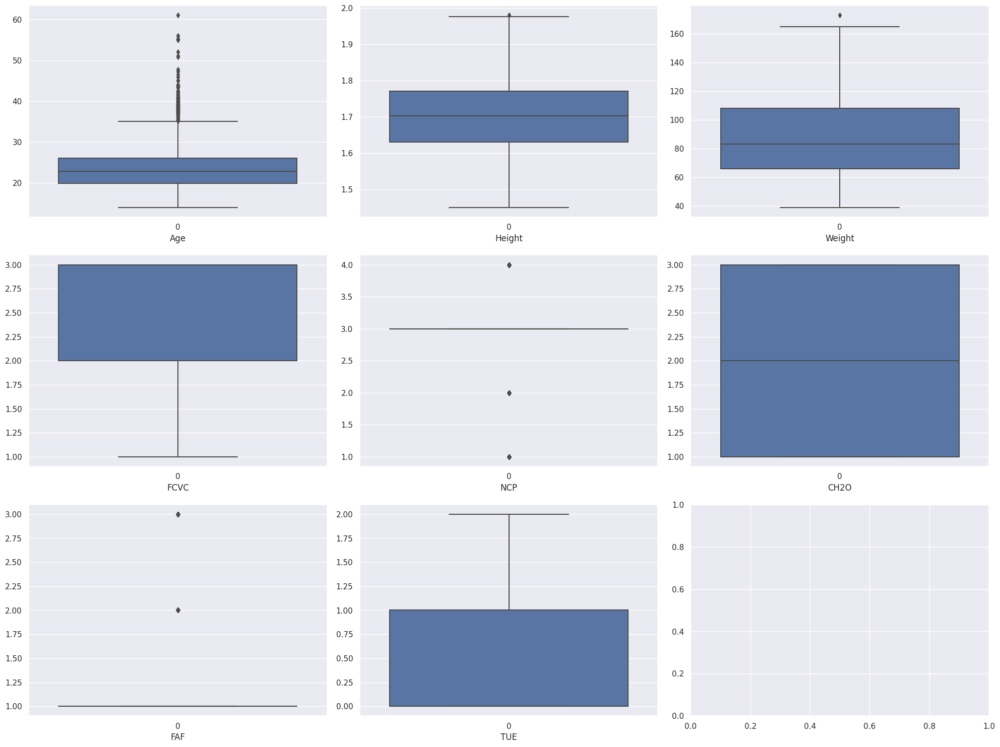

In [ ]:
numeric_cols = data.select_dtypes(include=['number']).columns

num_cols = len(numeric_cols)
num_rows = (num_cols + 2) // 3
fig, axes = plt.subplots(nrows=num_rows, ncols=3, figsize=(20, 15))

for i, col in enumerate(numeric_cols):
    sns.boxplot(data=data[col], ax=axes[i//3, i%3])
    axes[i//3, i%3].set_xlabel(col)

plt.tight_layout()
plt.show()

### Remove Outlier Data using Z score

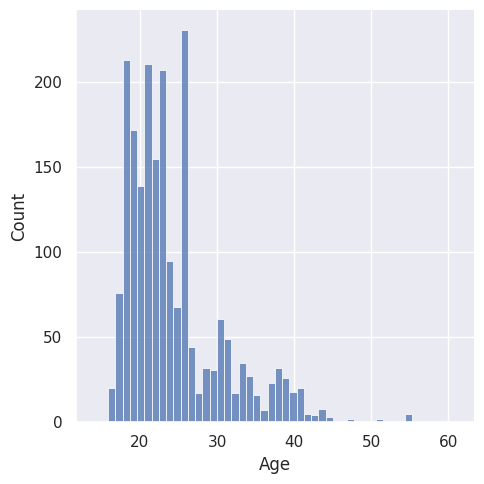

In [ ]:
sns.displot(data['Age'])

In [ ]:
z = stats.zscore(data['Age'])
print(z)

0      -0.528743
1      -0.528743
2      -0.214951
3       0.412634
4      -0.371847
          ...   
2106   -0.532376
2107   -0.374523
2108   -0.289628
2109   -0.001268
2110   -0.110660
Name: Age, Length: 2078, dtype: float64


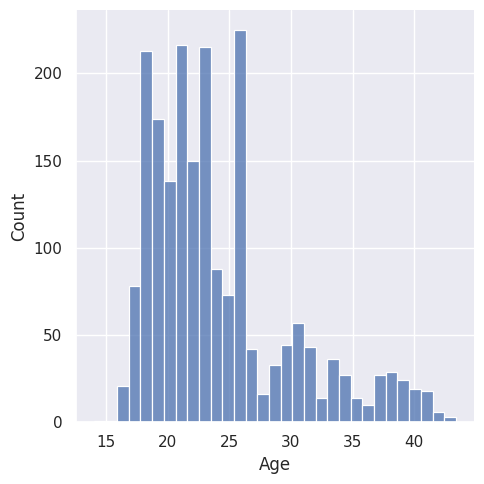

In [ ]:
z_age_data = data[(z < 3)]
sns.displot(z_age_data['Age'])

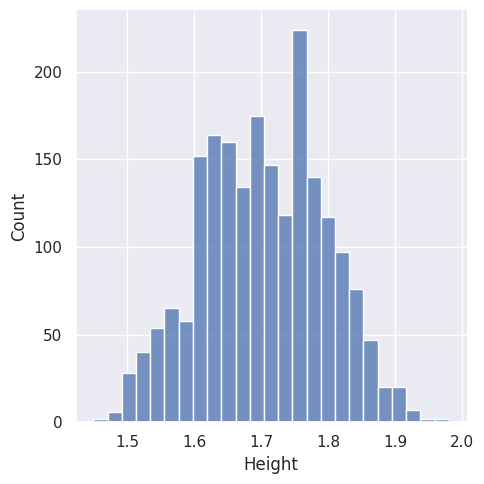

In [ ]:
sns.displot(z_age_data['Height'])

In [ ]:
z = stats.zscore(z_age_data['Height'])
print(z)

0      -0.894185
1      -1.966281
2       1.035589
3       1.035589
4       0.821169
          ...   
2106    0.078528
2107    0.484360
2108    0.523191
2109    0.386434
2110    0.379852
Name: Height, Length: 2055, dtype: float64


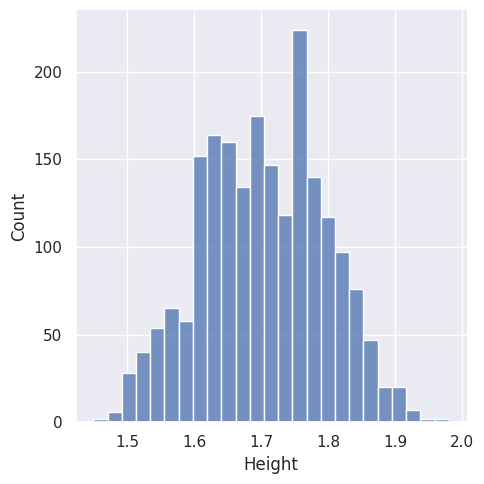

In [ ]:
z_height_data = z_age_data[(z < 3)]
sns.displot(z_height_data['Height'])

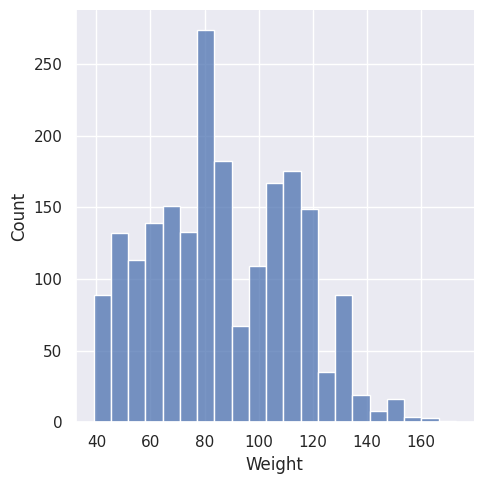

In [ ]:
sns.displot(z_height_data['Weight'])

In [ ]:
z = stats.zscore(z_height_data['Weight'])
print(z)

0      -0.877811
1      -1.182226
2      -0.383138
3      -0.002619
4       0.103926
          ...   
2106    1.687206
2107    1.776035
2108    1.773995
2109    1.760955
2110    1.765749
Name: Weight, Length: 2055, dtype: float64


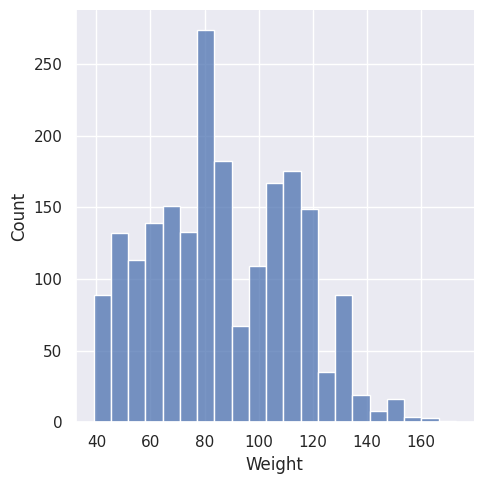

In [ ]:
z_weight_data = z_height_data[(z < 3)]
sns.displot(z_height_data['Weight'])

In [ ]:
data_clean = z_weight_data.reset_index(drop=True)

In [ ]:
data_clean.describe(include="all")

,Gender,Age,Height,Weight,family_history_with_overweight,FAVC,FCVC,NCP,CAEC,SMOKE,CH2O,SCC,FAF,TUE,CALC,MTRANS,NObeyesdad
count,2054,2054.000000,2054.000000,2054.000000,2054,2054,2054.000000,2054.000000,2054,2054,2054.000000,2054,2054.000000,2054.000000,2054,2054,2054
unique,2,NaN,NaN,NaN,2,2,NaN,NaN,4,2,NaN,2,NaN,NaN,4,5,7
top,Male,NaN,NaN,NaN,yes,yes,NaN,NaN,Sometimes,no,NaN,no,NaN,NaN,Sometimes,Public_Transportation,Obesity_Type_I
freq,1037,NaN,NaN,NaN,1698,1817,NaN,NaN,1738,2014,NaN,1960,NaN,NaN,1371,1548,343
mean,NaN,24.095523,1.703324,87.027004,NaN,NaN,2.452775,2.704966,NaN,NaN,2.023369,NaN,1.292600,0.568160,NaN,NaN,NaN
std,NaN,5.816346,0.093248,26.224227,NaN,NaN,0.612788,0.840757,NaN,NaN,0.752615,NaN,0.567485,0.693705,NaN,NaN,NaN
min,NaN,14.000000,1.450000,39.000000,NaN,NaN,1.000000,1.000000,NaN,NaN,1.000000,NaN,1.000000,0.000000,NaN,NaN,NaN
25%,NaN,19.874590,1.631386,66.000000,NaN,NaN,2.000000,3.000000,NaN,NaN,1.000000,NaN,1.000000,0.000000,NaN,NaN,NaN
50%,NaN,22.815036,1.703150,83.364352,NaN,NaN,3.000000,3.000000,NaN,NaN,2.000000,NaN,1.000000,0.000000,NaN,NaN,NaN
75%,NaN,26.000000,1.770000,108.249378,NaN,NaN,3.000000,3.000000,NaN,NaN,3.000000,NaN,1.000000,1.000000,NaN,NaN,NaN


## HASIL DATA CLEANING
- DATA AWAL : 2111
- DATA SETELAH CLEANING : 2054


### Histogram Data yang Sudah Dibersihkan

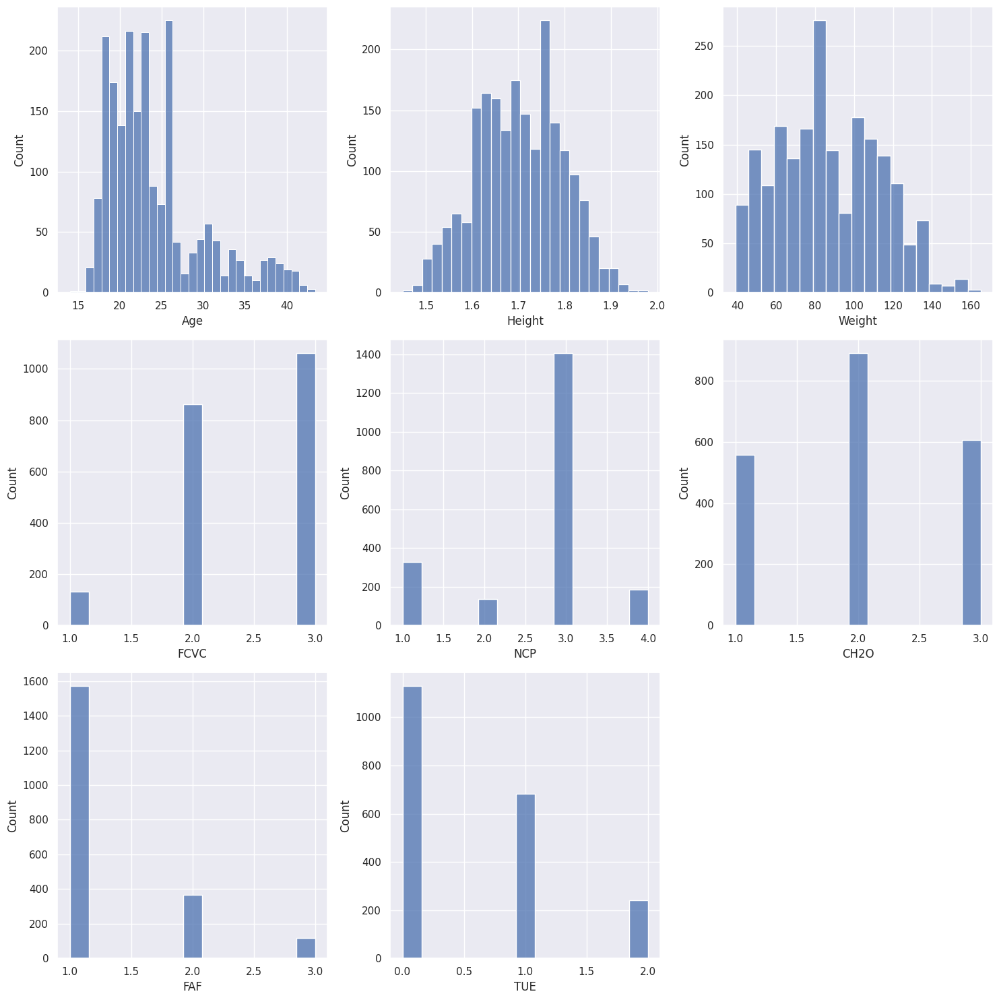

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

numeric_cols = data_clean.select_dtypes(include=['number']).columns

num_cols = len(numeric_cols)
num_rows = (num_cols + 2) // 3
num_cols_per_row = min(num_cols, 3)

fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols_per_row, figsize=(15, 5*num_rows))

for i, col in enumerate(numeric_cols):
    row_index = i // num_cols_per_row
    col_index = i % num_cols_per_row
    sns.histplot(data=data_clean[col], ax=axes[row_index, col_index])

for i in range(num_cols, num_rows * num_cols_per_row):
    fig.delaxes(axes.flatten()[i])

plt.tight_layout()
plt.show()

### Boxplot Data yang sudah Dibersihkan

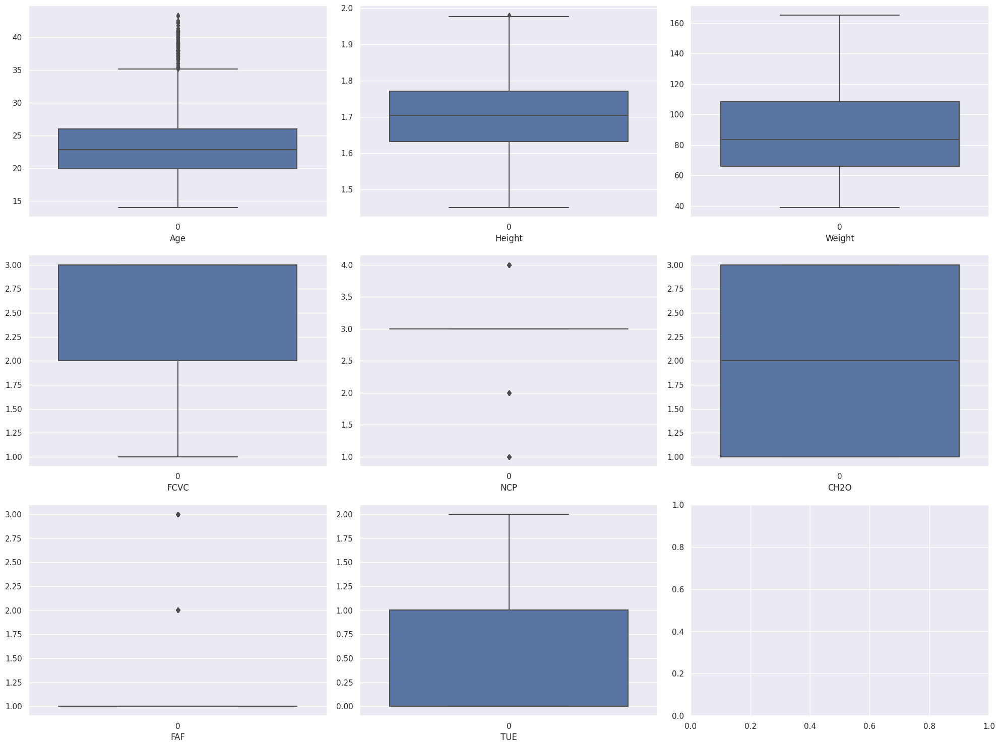

In [ ]:
numeric_cols = data_clean.select_dtypes(include=['number']).columns

num_cols = len(numeric_cols)
num_rows = (num_cols + 2) // 3
fig, axes = plt.subplots(nrows=num_rows, ncols=3, figsize=(20, 15))

for i, col in enumerate(numeric_cols):
    sns.boxplot(data=data_clean[col], ax=axes[i//3, i%3])
    axes[i//3, i%3].set_xlabel(col)

plt.tight_layout()
plt.show()

## **Data Encoding**

### teknik encoding yang digunakan merupakan label_encoding untuk merubah categorical value menjadi bentuk integer

In [ ]:
label_encoder = LabelEncoder()

data_clean['Gender'] = label_encoder.fit_transform(data_clean['Gender'])
data_clean['family_history_with_overweight'] = label_encoder.fit_transform(data_clean['family_history_with_overweight'])
data_clean['FAVC'] = label_encoder.fit_transform(data_clean['FAVC'])
data_clean['CAEC'] = label_encoder.fit_transform(data_clean['CAEC'])
data_clean['SMOKE'] = label_encoder.fit_transform(data_clean['SMOKE'])
data_clean['SCC'] = label_encoder.fit_transform(data_clean['SCC'])
data_clean['CALC'] = label_encoder.fit_transform(data_clean['CALC'])
data_clean['MTRANS'] = label_encoder.fit_transform(data_clean['MTRANS'])


In [ ]:
mapping = {
    'Insufficient_Weight': 0,
    'Normal_Weight': 1,
    'Overweight_Level_I': 2,
    'Overweight_Level_II': 2,
    'Obesity_Type_I': 3,
    'Obesity_Type_II': 3,
    'Obesity_Type_III': 3
}

data_clean['NObeyesdad'] = data_clean['NObeyesdad'].replace(mapping)

In [ ]:
data_clean

,Gender,Age,Height,Weight,family_history_with_overweight,FAVC,FCVC,NCP,CAEC,SMOKE,CH2O,SCC,FAF,TUE,CALC,MTRANS,NObeyesdad
0,0,21.000000,1.620000,64.000000,1,0,2,3,2,0,2,0,1,1,3,3,1
1,0,21.000000,1.520000,56.000000,1,0,3,3,2,1,3,1,3,0,2,3,1
2,1,23.000000,1.800000,77.000000,1,0,2,3,2,0,2,0,2,1,1,3,1
3,1,27.000000,1.800000,87.000000,0,0,3,3,2,0,2,0,2,0,1,4,2
4,1,22.000000,1.780000,89.800000,0,0,2,1,2,0,2,0,1,0,2,3,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2049,0,20.976842,1.710730,131.408528,1,1,3,3,2,0,2,0,1,1,2,3,3
2050,0,21.982942,1.748584,133.742943,1,1,3,3,2,0,2,0,1,0,2,3,3
2051,0,22.524036,1.752206,133.689352,1,1,3,3,2,0,2,0,1,0,2,3,3
2052,0,24.361936,1.739450,133.346641,1,1,3,3,2,0,3,0,1,0,2,3,3


In [ ]:
class_count_1 = data_clean[data_clean['NObeyesdad'] == 1].shape[0]
class_count_2 = data_clean[data_clean['NObeyesdad'] == 2].shape[0]
class_count_3 = data_clean[data_clean['NObeyesdad'] == 3].shape[0]
class_count_4 = data_clean[data_clean['NObeyesdad'] == 4].shape[0]

print("Number of instances of class", "Insufficient_Weight", ":", class_count_1)
print("Number of instances of class", "Normal_Weight", ":", class_count_2)
print("Number of instances of class", "Overweight", ":", class_count_3)
print("Number of instances of class", "Obesity", ":", class_count_4)

Number of instances of class Insufficient_Weight : 275
Number of instances of class Normal_Weight : 552
Number of instances of class Overweight : 963
Number of instances of class Obesity : 0


Data di encode untuk mempermudah dalam analisa data menggunakan bentuk numerical.


# Data Analysis

In [ ]:
cormat = data_clean.corr()
round(cormat,2)

,Gender,Age,Height,Weight,family_history_with_overweight,FAVC,FCVC,NCP,CAEC,SMOKE,CH2O,SCC,FAF,TUE,CALC,MTRANS,NObeyesdad
Gender,1.00,0.05,0.63,0.16,0.12,0.06,-0.24,0.06,0.07,0.05,0.08,-0.10,0.12,0.03,0.01,-0.14,0.06
Age,0.05,1.00,-0.02,0.23,0.23,0.08,0.03,-0.08,0.11,0.05,-0.05,-0.14,-0.10,-0.27,-0.08,-0.61,0.36
Height,0.63,-0.02,1.00,0.45,0.23,0.18,-0.03,0.22,0.06,0.06,0.20,-0.14,0.14,0.02,-0.13,-0.07,0.12
Weight,0.16,0.23,0.45,1.00,0.50,0.28,0.17,0.07,0.30,0.03,0.20,-0.21,-0.18,-0.14,-0.21,0.01,0.84
family_history_with_overweight,0.12,0.23,0.23,0.50,1.00,0.22,0.04,0.01,0.21,0.01,0.16,-0.20,-0.11,-0.04,0.03,-0.09,0.52
FAVC,0.06,0.08,0.18,0.28,0.22,1.00,-0.02,-0.00,0.15,-0.03,0.02,-0.18,-0.11,0.03,-0.10,-0.06,0.25
FCVC,-0.24,0.03,-0.03,0.17,0.04,-0.02,1.00,0.02,-0.03,0.01,0.08,0.06,0.02,-0.12,-0.03,0.04,0.05
NCP,0.06,-0.08,0.22,0.07,0.01,-0.00,0.02,1.00,-0.06,0.01,0.07,-0.02,0.10,-0.02,-0.09,-0.04,-0.10
CAEC,0.07,0.11,0.06,0.30,0.21,0.15,-0.03,-0.06,1.00,-0.06,0.10,-0.11,-0.08,-0.07,-0.05,-0.06,0.37
SMOKE,0.05,0.05,0.06,0.03,0.01,-0.03,0.01,0.01,-0.06,1.00,-0.06,0.04,0.01,0.04,-0.09,-0.00,0.01


<Axes: >

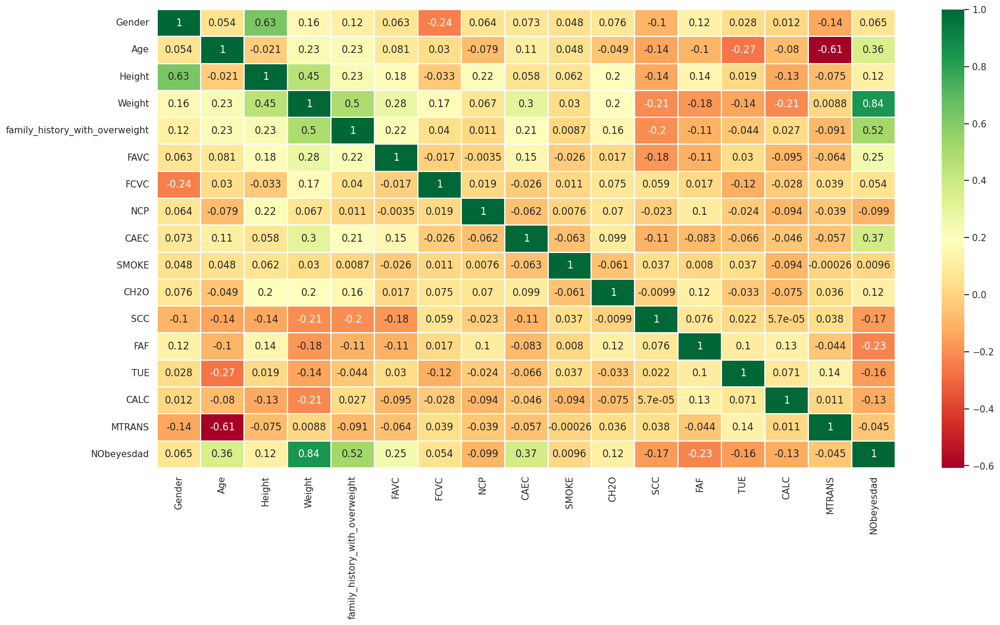

In [ ]:
plt.figure(figsize=(20, 10))
sns.heatmap(cormat, cmap='RdYlGn', linewidths=0.1, annot=True)

### **Korelasi Positif**:
* ###  Height dan Gender (0.63): Ada korelasi antara tinggi badan dengan jenis kelamin, korelasi tersebut bisa karena rata-rata laki-laki lebih tinggi daripada wanita.
* ###   Height dan Weight (0.45): Orang yang lebih tinggi cenderung memiliki berat badan yang lebih besar dalam dataset ini.
* ### Family History and Weight (0.5): Orang dengan riwayat kelebihan berat badan di keluarga cenderung mengikuti riwayat tersebut dan memiliki berat badan yang lebih besar.
* ### Family History dan NObeyesdad (0.52): Orang dengan riwayat berat badan di keluarga cenderung lebih overweight atau bahkan obese.
* ### CAEC (Habit Snacking) dan Weight (0.3): Orang dengan kebiasaan untuk makan cemilan diantara makanan berat cenderung memiliki berat badan yang lebih besar.
* ### CAEC (Habit Snacking) dan NObeyesdad (0.37): Orang dengan kebiasaan untuk makan cemilan diantara makanan berat cenderung tergolong overweight/obesitas.
* ### Age dan NObeyesdad (0.36): Orang dengan usia semakin tua semakin cenderung mengalami obesitas
* ### Weight dan NObeyesdad (0.84): Orang dengan berat badan semakin besar semakin cenderung mengalami obesitas
* ### FAVC dan NObeyesdad (0.25): Orang yang banyak mengonsumsi makanan berkalori tinggi cenderung mengalami obesitas

### **Korelasi Negatif**:
* ### MTRANS (Jenis Transportasi) and Age (-0.61): Ada kecenderungan bagi orang yang lebih tua dalam dataset untuk menggunakan metode transportasi yang berbeda dibandingkan dengan orang yang lebih muda.
* ### TUE (Jumlah Waktu menggunakan Teknologi) and Age (-0.27): Orang yang lebih muda cenderung lebih banyak menggunakan teknologi dengan jangka waktu yang lebih panjang.



### **Model yang ingin kami buat adalah model untuk memprediksi status obesitas berdasarkan fitur-fitur lainnya.**

### NObeyesdad menjadi fitur target karena itu adalah label kelas **untuk klasifikasi.**

### **Mengapa penting untuk melakukan analisis data dan membuat model prediksi untuk data yang kami gunakan?**

> ### Menurut WHO (World Health Organizaton), orang-orang dengan BMI yang melebihi 25kg/m^2 termasuk ke dalam kategori *overweight* atau *obese* yang menjadi sebuah masalah untuk kesehatan manusia karena relasinya kepada perkembangan penyakit kronis maupun kematian lebih awal.

### **Alasan untuk menganalisis data dan membuat model ini adalah untuk:**

* ### Memahami Obesitas: Memeriksa dampak obesitas terhadap kesehatan dan kesejahteraan.
* ### Manfaat Penurunan Berat Badan: Mengevaluasi bukti yang menunjukkan bahwa penurunan berat badan dapat meningkatkan hasil yang berhubungan dengan kesehatan.
* ### Strategi Manajemen Berat Badan: Mempertimbangkan berbagai strategi yang dapat membantu individu mencapai dan mempertahankan penurunan berat badan.
* ### Peran Praktisi Perawat: Menyoroti peran kunci praktisi perawat dalam menetapkan target penurunan berat badan dan mengimplementasikan program menurunan berat badan.

### Reference sources:


1. ### Centres for Disease Control and Prevention . (2016). Overweight and obesity. Retrieved from https://www.cdc.gov/obesity/
2. ### Cochrane, G. (2008). Role for a sense of self‐worth in weight‐loss treatments: Helping patients develop self‐efficacy. Canadian Family Physician, 54(4), 543–547. Retrieved from https://pubmed.ncbi.nlm.nih.gov/18411382/
3. ### American Nurse Practitioner Foundation . (2013). Nurse practitioners and the prevention and treatment of adult obesity—A White Paper of the American Nurse Practitioner Foundation (electronic version). Summer. Retrieved from https://international.aanp.org/Content/docs/ObesityWhitePaper.pdf



## **Feature Transformation**

### **Ada 1 Feature Transformation yang kami lakukan, yaitu:**

1. ### Menambahkan field BMI
### Kami berasumsi bahwa Body Mass Index seseorang akan mempermudah dalam memprediksi apakah seseorang termasuk kategori underweight, normal, overweight, atau obesity

In [ ]:
# BMI = weight/height^2

data_clean['BMI'] = data_clean['Weight'] / (data_clean['Height'] * data_clean['Height'])

In [ ]:
data_clean.head()

,Gender,Age,Height,Weight,family_history_with_overweight,FAVC,FCVC,NCP,CAEC,SMOKE,CH2O,SCC,FAF,TUE,CALC,MTRANS,NObeyesdad,BMI
0,0,21.0,1.62,64.0,1,0,2,3,2,0,2,0,1,1,3,3,1,24.386526
1,0,21.0,1.52,56.0,1,0,3,3,2,1,3,1,3,0,2,3,1,24.238227
2,1,23.0,1.80,77.0,1,0,2,3,2,0,2,0,2,1,1,3,1,23.765432
3,1,27.0,1.80,87.0,0,0,3,3,2,0,2,0,2,0,1,4,2,26.851852
4,1,22.0,1.78,89.8,0,0,2,1,2,0,2,0,1,0,2,3,2,28.342381


In [ ]:
data_clean.tail()

,Gender,Age,Height,Weight,family_history_with_overweight,FAVC,FCVC,NCP,CAEC,SMOKE,CH2O,SCC,FAF,TUE,CALC,MTRANS,NObeyesdad,BMI
2049,0,20.976842,1.710730,131.408528,1,1,3,3,2,0,2,0,1,1,2,3,3,44.901475
2050,0,21.982942,1.748584,133.742943,1,1,3,3,2,0,2,0,1,0,2,3,3,43.741923
2051,0,22.524036,1.752206,133.689352,1,1,3,3,2,0,2,0,1,0,2,3,3,43.543817
2052,0,24.361936,1.739450,133.346641,1,1,3,3,2,0,3,0,1,0,2,3,3,44.071535
2053,0,23.664709,1.738836,133.472641,1,1,3,3,2,0,3,0,1,0,2,3,3,44.144338


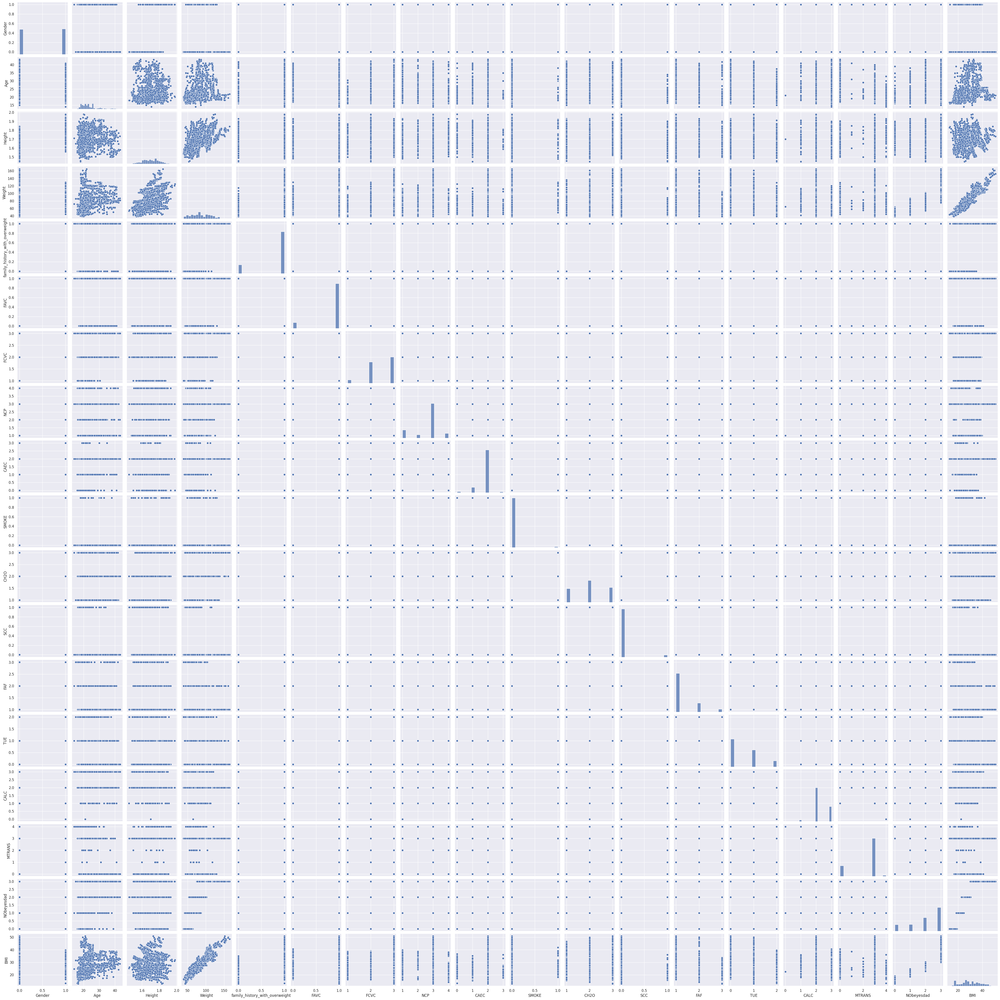

In [ ]:
numeric_cols = data_clean.select_dtypes(include=['number'])

sns.pairplot(numeric_cols)
plt.show()

In [ ]:
cormat = data_clean.corr()
round(cormat,2)

,Gender,Age,Height,Weight,family_history_with_overweight,FAVC,FCVC,NCP,CAEC,SMOKE,CH2O,SCC,FAF,TUE,CALC,MTRANS,NObeyesdad,BMI
Gender,1.00,0.05,0.63,0.16,0.12,0.06,-0.24,0.06,0.07,0.05,0.08,-0.10,0.12,0.03,0.01,-0.14,0.06,-0.06
Age,0.05,1.00,-0.02,0.23,0.23,0.08,0.03,-0.08,0.11,0.05,-0.05,-0.14,-0.10,-0.27,-0.08,-0.61,0.36,0.27
Height,0.63,-0.02,1.00,0.45,0.23,0.18,-0.03,0.22,0.06,0.06,0.20,-0.14,0.14,0.02,-0.13,-0.07,0.12,0.12
Weight,0.16,0.23,0.45,1.00,0.50,0.28,0.17,0.07,0.30,0.03,0.20,-0.21,-0.18,-0.14,-0.21,0.01,0.84,0.93
family_history_with_overweight,0.12,0.23,0.23,0.50,1.00,0.22,0.04,0.01,0.21,0.01,0.16,-0.20,-0.11,-0.04,0.03,-0.09,0.52,0.49
FAVC,0.06,0.08,0.18,0.28,0.22,1.00,-0.02,-0.00,0.15,-0.03,0.02,-0.18,-0.11,0.03,-0.10,-0.06,0.25,0.25
FCVC,-0.24,0.03,-0.03,0.17,0.04,-0.02,1.00,0.02,-0.03,0.01,0.08,0.06,0.02,-0.12,-0.03,0.04,0.05,0.21
NCP,0.06,-0.08,0.22,0.07,0.01,-0.00,0.02,1.00,-0.06,0.01,0.07,-0.02,0.10,-0.02,-0.09,-0.04,-0.10,0.00
CAEC,0.07,0.11,0.06,0.30,0.21,0.15,-0.03,-0.06,1.00,-0.06,0.10,-0.11,-0.08,-0.07,-0.05,-0.06,0.37,0.33
SMOKE,0.05,0.05,0.06,0.03,0.01,-0.03,0.01,0.01,-0.06,1.00,-0.06,0.04,0.01,0.04,-0.09,-0.00,0.01,0.00


<Axes: >

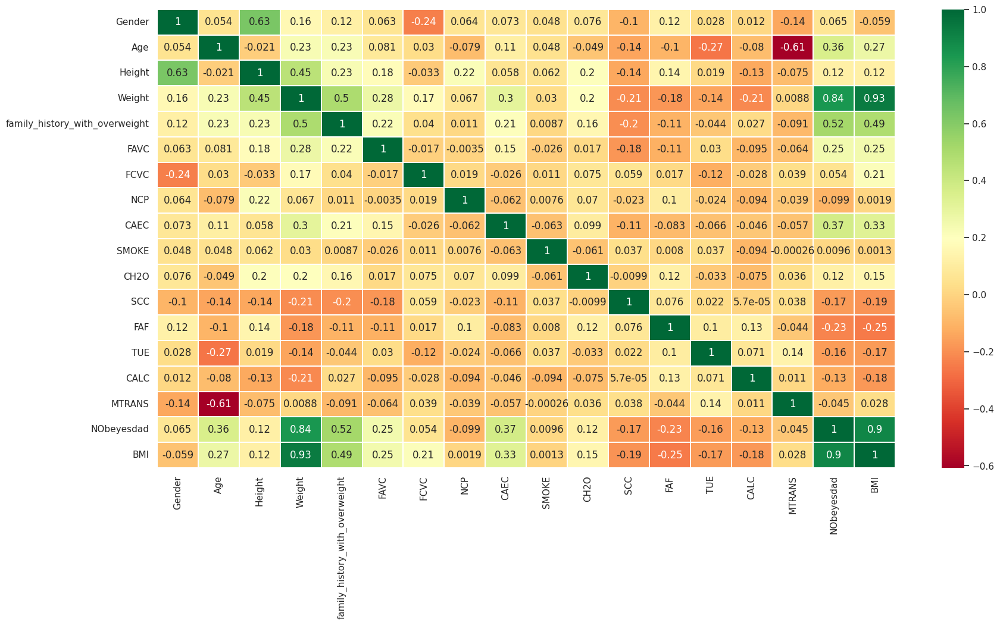

In [ ]:
plt.figure(figsize=(20, 10))
sns.heatmap(cormat, cmap='RdYlGn', linewidths=0.1, annot=True)

### BMI dan NObeyesdad memiliki korelasi yang sangat positif (0.9), yang mana artinya orang dengan BMI semakin tinggi memiliki kecenderungan sangat tinggi untuk masuk ke dalam kategori obesitas



## **Feature Selection**

### Kami memilih Recursive Feature Elimination Cross Validation (RFECV) karena beberapa alasan :
1. ### Automated Feature Selection : secara otomatis memilih jumlah fitur yang optimal dengan cara cross-validation
2. ### Cross-Validation : mengevaluasi subset fitur yang berbeda menggunakan cross-validation yang menghasilkan perkiraan model performance yang lebih bagus daripada single train-test split
3. ### Mengatasi Overfitting : Cross validation membantu dalam mendeteksi dan mengurangi overfitting dengan menilai performance model pada lipatan (folds) data yang berdeda. RFECV memsatikan bahwa fitur yang dipilih berkontribusi pada kemampuan umum model daripada hanya menghafal data pelatihan.

In [ ]:
from sklearn.feature_selection import RFECV
from sklearn.ensemble import RandomForestClassifier
from sklearn.datasets import make_classification
from sklearn.model_selection import StratifiedKFold
import numpy as np

X = data_clean.drop(columns=['NObeyesdad', 'Weight', 'Height'])
y = data_clean['NObeyesdad']


estimator = RandomForestClassifier(n_estimators=100, random_state=42)

selector = RFECV(estimator, cv=5, scoring='accuracy')

selector.fit(X, y)

for i, col in zip(range(X.shape[1]), X.columns):
  print('Column: %s, Selected %s, Rank: %.3f' % (col, selector.support_[i], selector.ranking_[i]))

n_features_to_select = len(X.columns)
for i in range(n_features_to_select, 0, -1):
    print(f"Iteration {n_features_to_select - i + 1}:")
    selected_features = X.columns[selector.support_ == True]
    print(f"  Selected Features: {selected_features.tolist()}")
    print(f"  Cross-Validation Scores: {selector.cv_results_['mean_test_score'][n_features_to_select - i]:.4f}")
    print()

results = pd.DataFrame(selector.cv_results_)
display(results)

Column: Gender, Selected False, Rank: 7.000
Column: Age, Selected True, Rank: 1.000
Column: family_history_with_overweight, Selected True, Rank: 1.000
Column: FAVC, Selected False, Rank: 5.000
Column: FCVC, Selected False, Rank: 4.000
Column: NCP, Selected False, Rank: 2.000
Column: CAEC, Selected True, Rank: 1.000
Column: SMOKE, Selected False, Rank: 12.000
Column: CH2O, Selected False, Rank: 9.000
Column: SCC, Selected False, Rank: 11.000
Column: FAF, Selected False, Rank: 8.000
Column: TUE, Selected False, Rank: 10.000
Column: CALC, Selected False, Rank: 6.000
Column: MTRANS, Selected False, Rank: 3.000
Column: BMI, Selected True, Rank: 1.000
Iteration 1:
  Selected Features: ['Age', 'family_history_with_overweight', 'CAEC', 'BMI']
  Cross-Validation Scores: 0.9859

Iteration 2:
  Selected Features: ['Age', 'family_history_with_overweight', 'CAEC', 'BMI']
  Cross-Validation Scores: 0.9869

Iteration 3:
  Selected Features: ['Age', 'family_history_with_overweight', 'CAEC', 'BMI']
  C

,mean_test_score,std_test_score,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score
0,0.985885,0.005629,0.987835,0.975669,0.985401,0.987835,0.992683
1,0.986857,0.007934,0.997567,0.973236,0.987835,0.985401,0.990244
2,0.964959,0.039308,0.888078,0.968370,0.990268,0.987835,0.990244
3,0.987346,0.007753,0.985401,0.973236,0.990268,0.992701,0.995122
4,0.983453,0.011030,0.965937,0.975669,0.987835,0.992701,0.995122
5,0.976639,0.022749,0.931873,0.980535,0.990268,0.987835,0.992683
6,0.975667,0.024811,0.927007,0.980535,0.990268,0.985401,0.995122
7,0.968854,0.040694,0.888078,0.980535,0.992701,0.987835,0.995122
8,0.981020,0.017970,0.946472,0.980535,0.992701,0.990268,0.995122
9,0.972747,0.034180,0.905109,0.980535,0.992701,0.990268,0.995122


Dalam RFECV kita memakai "cv = 5" yang artinya kita membagi dataset menjadi 5 folds untuk cross validation, kemudian pada "selector.fit(X, y)" RFECV secara rekursif menghapus fitur dan mengevaluasi kepentingan melalui cross validation. Sehingga akhirnya terpilih fitur Gender, Age, FCVC, NCP, dan BMI.

In [ ]:
data_clean_2 = data_clean[['Age', 'family_history_with_overweight', 'CAEC', 'BMI', 'NObeyesdad']]

In [ ]:
data_clean_2.describe(include='all')

,Age,family_history_with_overweight,CAEC,BMI,NObeyesdad
count,2054.000000,2054.000000,2054.000000,2054.000000,2054.000000
mean,24.095523,0.826680,1.855891,29.804407,2.077897
std,5.816346,0.378616,0.457307,8.050143,1.054191
min,14.000000,0.000000,0.000000,12.998685,0.000000
25%,19.874590,1.000000,2.000000,24.383411,1.000000
50%,22.815036,1.000000,2.000000,28.910809,2.000000
75%,26.000000,1.000000,2.000000,36.134194,3.000000
max,43.376340,1.000000,3.000000,50.811753,3.000000


In [ ]:
data_clean_2.head(20)

,Age,family_history_with_overweight,CAEC,BMI,NObeyesdad
0,21.0,1,2,24.386526,1
1,21.0,1,2,24.238227,1
2,23.0,1,2,23.765432,1
3,27.0,0,2,26.851852,2
4,22.0,0,2,28.342381,2
5,29.0,0,2,20.195092,1
6,23.0,1,2,24.444444,1
7,22.0,0,2,19.705532,1
8,24.0,1,2,20.199470,1
9,22.0,1,2,22.985398,1


In [ ]:
profile = ProfileReport(data_clean_2)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# **Random Forest**

Alasan kita memakai Random Forest karena beberapa alasan :  
- Mencegah Overfitting
- Bagus dalam menangani data yang memiliki banyak fitur (secara otomatis memilih subset fitur)
- Ketahanan terhadap Outlier

## Membagi data menjadi 2 bagian

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle
from sklearn.metrics import accuracy_score, confusion_matrix, precision_score, recall_score, ConfusionMatrixDisplay, f1_score

# Tree Visualisation
from sklearn.tree import export_graphviz
from IPython.display import Image
import graphviz

Sebelum melakukan data splitting, kita terlebih dahulu melakukan data shuffling untuk mencegah terjadinya bias.

* Tanpa data shuffling, jika data telah diurutkan berdasarkan kelasnya, setiap tree dalamrandom forest akan cenderung memilih fitur-fitur yang berada di awal dataset untuk membagi node, yang pada gilirannya dapat menghasilkan tree yang sangat serupa. Hal ini dapat menyebabkan overfitting dan model yang tidak mewakili variasi sebenarnya dalam data.

* Selain itu, data shuffle membantu model untuk mempelajari pola yang lebih umum daripada hanya bergantung pada urutan tertentu dari data. Efeknya model akan memiliki kemampuan generalisasi yang baik pada data baru.


## **Training model menggunakan data sebelum feature selection**

In [ ]:
X = data_clean.drop(columns=['NObeyesdad'])
y = data_clean['NObeyesdad']


X_shuffled, y_shuffled = shuffle(X, y, random_state=42)

X_train, X_rest, y_train, y_rest = train_test_split(X_shuffled, y_shuffled, test_size=0.4, random_state=42)

X_val, X_test, y_val, y_test = train_test_split(X_rest, y_rest, test_size=0.5, random_state=42)

In [ ]:
print("Shape of X_train:", X_train.shape)
print("Shape of X_test:", X_test.shape)
print("Shape of X_val:", X_val.shape)
print("Shape of y_train:", y_train.shape)
print("Shape of y_test:", y_test.shape)
print("Shape of y_val:", y_val.shape)

Shape of X_train: (1232, 17)
Shape of X_test: (411, 17)
Shape of X_val: (411, 17)
Shape of y_train: (1232,)
Shape of y_test: (411,)
Shape of y_val: (411,)


In [ ]:
rf = RandomForestClassifier()
rf.fit(X_train, y_train)

RandomForestClassifier()

In [ ]:
y_pred = rf.predict(X_test)

conf_matrix = confusion_matrix(y_test, y_pred)

print("           Predicted Classes")
print("         |   0   1   2   3 ")
print("---------------------------------")
for i in range(len(conf_matrix)):
    print("Actual", i, "|", " ".join("{:3}".format(x) for x in conf_matrix[i]))

           Predicted Classes
         |   0   1   2   3 
---------------------------------
Actual 0 |  51   1   0   0
Actual 1 |   1  60   0   0
Actual 2 |   0   0 106   0
Actual 3 |   0   0   0 192


In [ ]:
TP = np.sum(np.diag(conf_matrix))

FP = np.sum(conf_matrix, axis=0) - np.diag(conf_matrix)

FN = np.sum(conf_matrix, axis=1) - np.diag(conf_matrix)

print("True Positives (TP):", TP)
print("False Positives (FP):", FP)
print("False Negatives (FN):", FN)

True Positives (TP): 409
False Positives (FP): [1 1 0 0]
False Negatives (FN): [1 1 0 0]


In [ ]:
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, average='macro')
recall = recall_score(y_test, y_pred, average='macro')
f1 = f1_score(y_test, y_pred, average='macro')
print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)

Accuracy: 0.9951338199513382
Precision: 0.9910939470365699
Recall: 0.9910939470365699
F1 Score: 0.9910939470365699


## **Training model menggunakan data setelah feature selection**

In [ ]:
X = data_clean_2.drop(columns=['NObeyesdad'])
y = data_clean_2['NObeyesdad']

# Shuffle the data
# mencegah bias, biar repsentatif
X_shuffled, y_shuffled = shuffle(X, y, random_state=42)

# Split the shuffled data into training and the rest (validation + testing)
X_train, X_rest, y_train, y_rest = train_test_split(X_shuffled, y_shuffled, test_size=0.4, random_state=42)

# Split the rest data into validation and testing
X_val, X_test, y_val, y_test = train_test_split(X_rest, y_rest, test_size=0.5, random_state=42)

In [ ]:
print("Shape of X_train:", X_train.shape)
print("Shape of X_test:", X_test.shape)
print("Shape of X_val:", X_val.shape)
print("Shape of y_train:", y_train.shape)
print("Shape of y_test:", y_test.shape)
print("Shape of y_val:", y_val.shape)

Shape of X_train: (1232, 4)
Shape of X_test: (411, 4)
Shape of X_val: (411, 4)
Shape of y_train: (1232,)
Shape of y_test: (411,)
Shape of y_val: (411,)


In [ ]:
rf = RandomForestClassifier()
rf.fit(X_train, y_train)

RandomForestClassifier()

In [ ]:
y_pred = rf.predict(X_test)

# Confusion Matrix

In [ ]:
conf_matrix = confusion_matrix(y_test, y_pred)

print("           Predicted Classes")
print("         |   0   1   2   3 ")
print("---------------------------------")
for i in range(len(conf_matrix)):
    print("Actual", i, "|", " ".join("{:3}".format(x) for x in conf_matrix[i]))

           Predicted Classes
         |   0   1   2   3 
---------------------------------
Actual 0 |  51   1   0   0
Actual 1 |   0  60   1   0
Actual 2 |   0   0 106   0
Actual 3 |   0   0   0 192


Label Mapping :
- Insufficient_Weight: 0
- Normal_Weight: 1
- Overweight: 2
- Obesity: 3


In [ ]:
TP = np.sum(np.diag(conf_matrix))

FP = np.sum(conf_matrix, axis=0) - np.diag(conf_matrix)

FN = np.sum(conf_matrix, axis=1) - np.diag(conf_matrix)

print("True Positives (TP):", TP)
print("False Positives (FP):", FP)
print("False Negatives (FN):", FN)

True Positives (TP): 409
False Positives (FP): [0 1 1 0]
False Negatives (FN): [1 1 0 0]


In [ ]:
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, average='macro')
recall = recall_score(y_test, y_pred, average='macro')
f1 = f1_score(y_test, y_pred, average='macro')
print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)

Accuracy: 0.9951338199513382
Precision: 0.9935651907461315
Recall: 0.9910939470365699
F1 Score: 0.9923007459580551


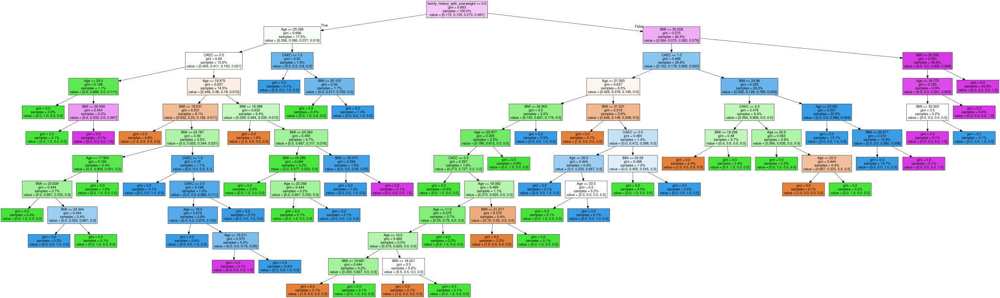

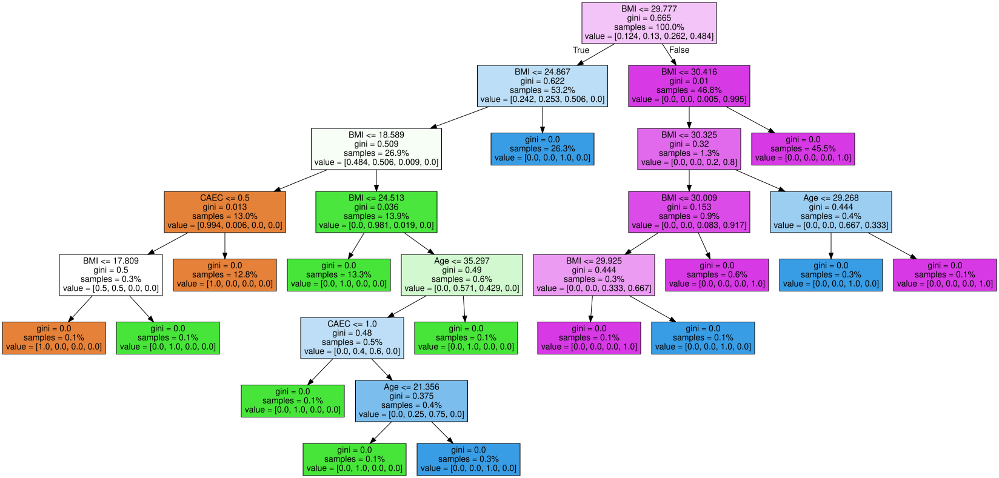

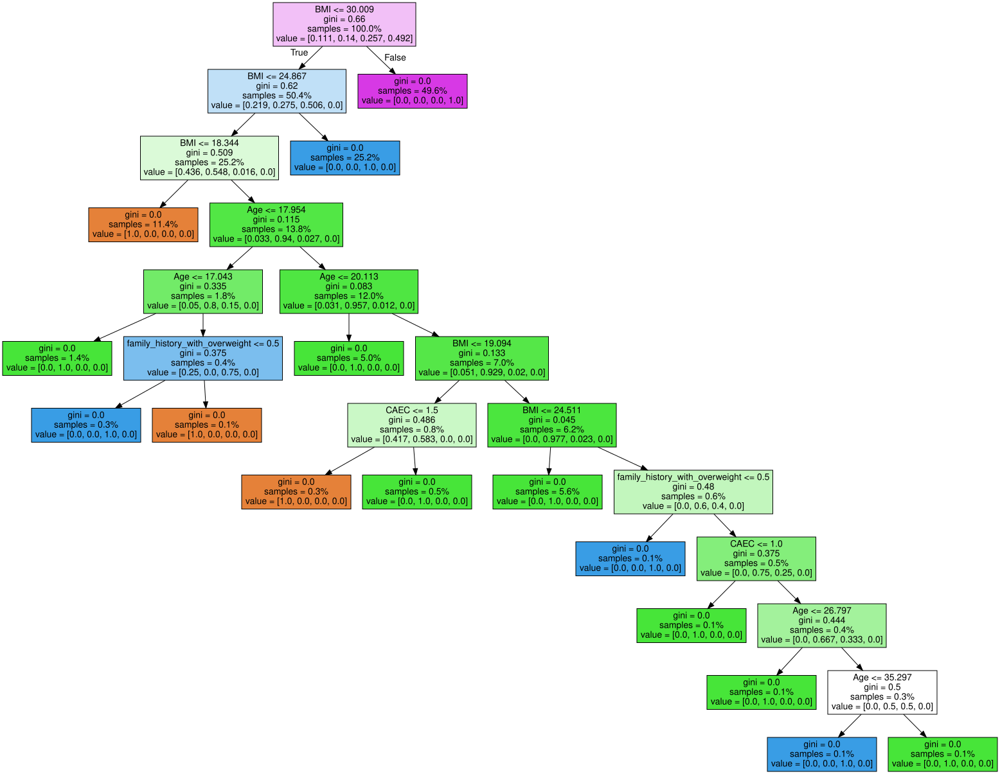

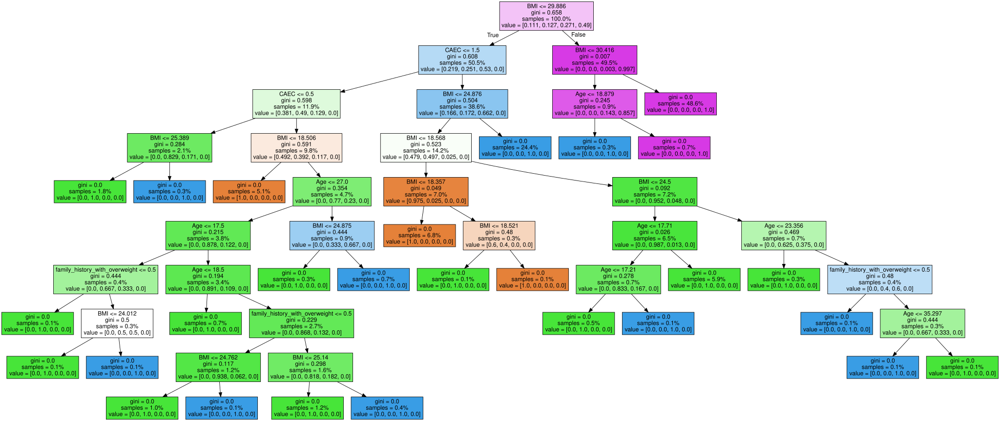

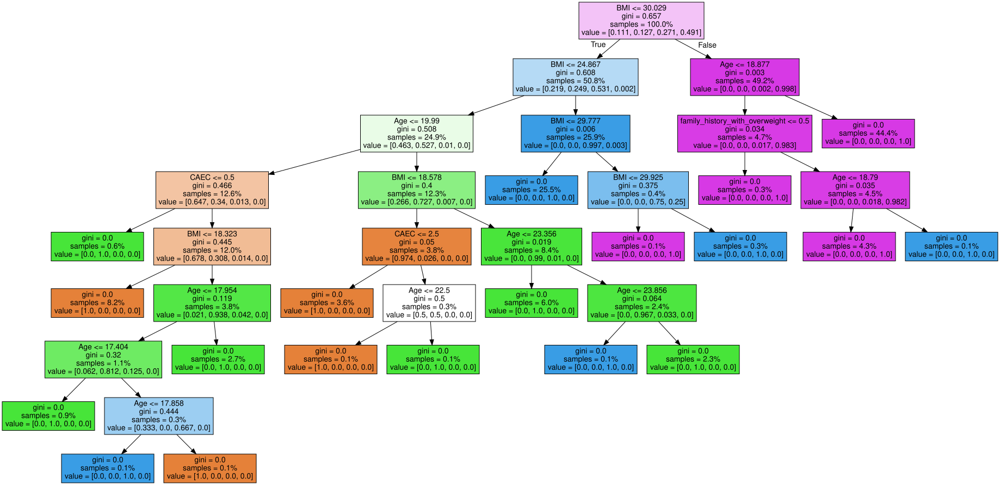

In [ ]:
for i in range(5):
    tree = rf.estimators_[i]
    dot_data = export_graphviz(tree,
                               feature_names=X_train.columns,
                               filled=True,
                               max_depth=18,
                               impurity=True,
                               proportion=True)
    graph = graphviz.Source(dot_data)
    display(graph)

# Hyperparameter Tuning

In [ ]:
from scipy.stats import randint
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import RandomizedSearchCV

In [ ]:
param_dist = {'n_estimators': randint(50,500),
              'max_depth': randint(1,20)}

rf = RandomForestClassifier()

rand_search = RandomizedSearchCV(rf,
                                 param_distributions = param_dist,
                                 n_iter=5,
                                 cv=5)

rand_search.fit(X_train, y_train)

RandomizedSearchCV(cv=5, estimator=RandomForestClassifier(), n_iter=5,
                   param_distributions={'max_depth': <scipy.stats._distn_infrastructure.rv_discrete_frozen object at 0x7b89976819c0>,
                                        'n_estimators': <scipy.stats._distn_infrastructure.rv_discrete_frozen object at 0x7b89ae681840>})

In [ ]:
best_rf = rand_search.best_estimator_

print('Best hyperparameters:',  rand_search.best_params_)

Best hyperparameters: {'max_depth': 5, 'n_estimators': 231}


* **Max-Depth:** Kedalaman maksimum dari sebuah pohon dalam Random Forest adalah sebuah hyperparameter penting yang membatasi kedalaman pohon untuk mencegah overfitting. Jika max_depth terlalu tinggi, maka decision tree mungkin akan overfitting dengan data pelatihan tanpa menangkap pola yang berguna.
* **N-Estimators:** Setiap pohon dalam random forest mengeluarkan prediksi kelas dan kelas dengan votes terbanyak menjadi prediksi model. Prediksi yang dibuat oleh decision tree mungkin tidak akurat, tetapi jika digabungkan, prediksi akan lebih mendekati nilai sebenarnya secara rata-rata.

Hasil yang kami dapatkan adalah untuk set hyperparaameter kami dimana max depth treenya **10** dan jumlah treenya **189**.

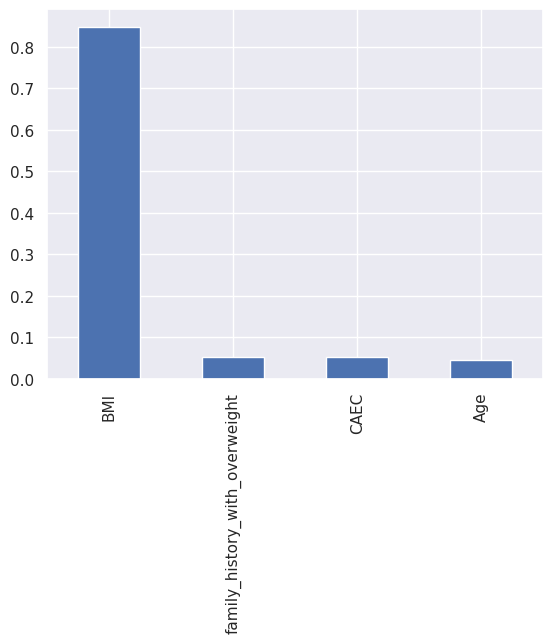

In [ ]:
# Create a series containing feature importances from the model and feature names from the training data
feature_importances = pd.Series(best_rf.feature_importances_, index=X_train.columns).sort_values(ascending=False)

# Plot a simple bar chart
feature_importances.plot.bar();

### Dari histogram diatas, dapat diketahui bahwa fitur dengan tingkat importance tertinggi adalah BMI, lalu disusul okeh age, cac, dan family_history_with_overweight. Hal ini tentu sejalan dengan selected feature hasil dari feature selection menggunakan RFECV



# **Support Vector Machine**

### Kami akan menguji 3 buah model SVM dengan kernel RBF berdasarkan 3 nilai gamma yang berbeda

In [ ]:
from sklearn.svm import SVC

# Define values for gamma
gamma_values = [0.1, 1.0, 10.0]

# Define kernel (RBF)
kernel = ['rbf']

# Initialize SVM classifier with specified hyperparameters
svm_1 = SVC(kernel='rbf', gamma= gamma_values[0]) # By default, 'scale' is used for gamma if not specified
svm_2 = SVC(kernel='rbf', gamma= gamma_values[1])
svm_3 = SVC(kernel='rbf', gamma= gamma_values[2])

# Fit SVM model to the training data
svm_1.fit(X_train, y_train)

SVC(gamma=0.1)

In [ ]:
y_pred_1 = svm_1.predict(X_test)

In [ ]:
svm_2.fit(X_train, y_train)
svm_3.fit(X_train, y_train)

SVC(gamma=10.0)

In [ ]:
y_pred_2 = svm_2.predict(X_test)
y_pred_3 = svm_3.predict(X_test)

### Evaluation untuk gamma 0.1

In [ ]:
conf_matrix = confusion_matrix(y_test, y_pred_1)

print("           Predicted Classes")
print("         |   0   1   2   3 ")
print("---------------------------------")
for i in range(len(conf_matrix)):
    print("Actual", i, "|", " ".join("{:3}".format(x) for x in conf_matrix[i]))

           Predicted Classes
         |   0   1   2   3 
---------------------------------
Actual 0 |  51   1   0   0
Actual 1 |   2  57   2   0
Actual 2 |   0   0 106   0
Actual 3 |   0   0   0 192


In [ ]:
accuracy = accuracy_score(y_test, y_pred_1)
precision = precision_score(y_test, y_pred_1, average='macro')
recall = recall_score(y_test, y_pred_1, average='macro')
f1 = f1_score(y_test, y_pred_1, average='macro')
print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)

Accuracy: 0.9878345498783455
Precision: 0.9816260632786332
Recall: 0.9787988650693569
F1 Score: 0.9800164925783397


### Evaluation untuk gamma 1.0

In [ ]:
conf_matrix = confusion_matrix(y_test, y_pred_2)

print("           Predicted Classes")
print("         |   0   1   2   3 ")
print("---------------------------------")
for i in range(len(conf_matrix)):
    print("Actual", i, "|", " ".join("{:3}".format(x) for x in conf_matrix[i]))

           Predicted Classes
         |   0   1   2   3 
---------------------------------
Actual 0 |  50   0   0   2
Actual 1 |   0  56   1   4
Actual 2 |   0   1 105   0
Actual 3 |   0   0   0 192


In [ ]:
accuracy = accuracy_score(y_test, y_pred_2)
precision = precision_score(y_test, y_pred_2, average='macro')
recall = recall_score(y_test, y_pred_2, average='macro')
f1 = f1_score(y_test, y_pred_2, average='macro')
print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)

Accuracy: 0.9805352798053528
Precision: 0.985679786945924
Recall: 0.9675343215398892
F1 Score: 0.976181530396715


### Evaluation untuk gamma 10.0

In [ ]:
conf_matrix = confusion_matrix(y_test, y_pred_3)

print("           Predicted Classes")
print("         |   0   1   2   3 ")
print("---------------------------------")
for i in range(len(conf_matrix)):
    print("Actual", i, "|", " ".join("{:3}".format(x) for x in conf_matrix[i]))

           Predicted Classes
         |   0   1   2   3 
---------------------------------
Actual 0 |  32   0   0  20
Actual 1 |   0  15   0  46
Actual 2 |   0   0  74  32
Actual 3 |   0   0   0 192


In [ ]:
accuracy = accuracy_score(y_test, y_pred_3)
precision = precision_score(y_test, y_pred_3, average='macro')
recall = recall_score(y_test, y_pred_3, average='macro')
f1 = f1_score(y_test, y_pred_3, average='macro')
print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)

Accuracy: 0.7615571776155717
Precision: 0.9155172413793103
Recall: 0.6398498655690119
F1 Score: 0.6938860810393896


## **Kesimpulan untuk model**

### Model dengan akurasi, precision, recall, dan f1-score terbaik adalah Random Forest dengan data yang digunakan adalah data setelah feature selection

# Clustering

In [ ]:
from sklearn import preprocessing

categorical = ['FAVC','FCVC', 'NCP', 'CAEC', 'family_history_with_overweight']
le = preprocessing.LabelEncoder()
for feature in categorical:
    data_clean[feature] = le.fit_transform(data_clean[feature])

correlation_matrix = data_clean.corr()

# Get the absolute correlation values with respect to the target variable
correlation_with_target = correlation_matrix['NObeyesdad'].abs()

# Sort the attributes based on their absolute correlation values in descending order
sorted_attributes = correlation_with_target.sort_values(ascending=False)

# Display the sorted list of attributes and their corresponding absolute correlation values
print("Sorted list of attributes based on absolute correlation with the target variable:")
print(sorted_attributes)

Sorted list of attributes based on absolute correlation with the target variable:
NObeyesdad                        1.000000
BMI                               0.897121
Weight                            0.841303
family_history_with_overweight    0.520771
CAEC                              0.374908
Age                               0.356672
FAVC                              0.252252
FAF                               0.226201
SCC                               0.170923
TUE                               0.163789
CALC                              0.126508
CH2O                              0.120491
Height                            0.119050
NCP                               0.099359
Gender                            0.064879
FCVC                              0.053955
MTRANS                            0.044788
SMOKE                             0.009641
Name: NObeyesdad, dtype: float64


Kita menggunakan FAVC, FCVC, NCP, CAEC, family_whistory_with_overweight sesuai dengan insight yang ingin kami cari.

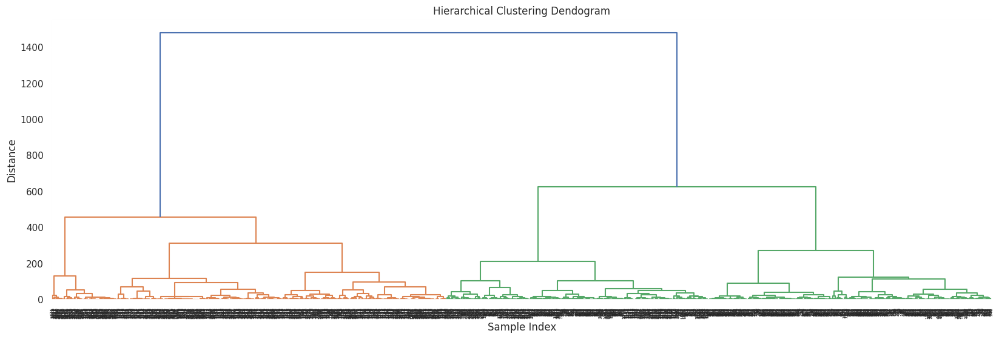

In [ ]:
from sklearn.cluster import KMeans
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster
X = data_clean.values

# Hierarchical clustering
Z = linkage(X, method='ward')

# Plot dendrogram
plt.figure(figsize=(20, 6))
plt.title('Hierarchical Clustering Dendogram')
plt.xlabel('Sample Index')
plt.ylabel('Distance')
dendrogram(Z)
plt.show()

### **Analisis Dendogram**

* ### Sumbu y menunjukkan jarak atau ketidaksamaan antar kelompok. Dalam gambar ini, skalanya berkisar antara 0 hingga 1400.
* ### Setiap penggabungan (fusion) dari dua klaster diwakili oleh perpecahan pada pohon, yang tingginya sebanding dengan jarak antara kedua klaster.
* ### Ada dua klaster primer yang digambarkan: satu klaster yang terbentuk di bawah jarak 400 (oranye) dan klaster lainnya yang terbentuk di sekitar jarak 1200 (hijau).
* ### Setiap klaster utama terbagi menjadi sub-klaster yang lebih kecil pada jarak yang berbeda-beda, yang mengindikasikan tingkat kemiripan yang berbeda di antara sampel-sampel di dalam setiap klaster utama.


### Dalam konteks pengelompokan hirarkis, dendogram memiliki dua tujuan utama:

* ### Memvisualisasikan hubungan hirarkis antar objek.
* ### Membantu dalam menentukan jumlah cluster yang sesuai.

In [ ]:
#chosing no. of clusters as 2 and refitting kmeans model
kmeans = KMeans(n_clusters = 2,random_state = 111)
kmeans.fit(data_clean)

KMeans(n_clusters=2, random_state=111)

In [ ]:
# #count number of records in every cluster
pd.Series(kmeans.labels_).value_counts()

1    1230
0     824
Name: count, dtype: int64

In [ ]:
# #predicting values
cluster_labels = kmeans.fit_predict(data_clean)

In [ ]:
# preds = kmeans.labels_
# kmeans_df = pd.DataFrame(data_clean)
# kmeans_df['KMeans_Clusters'] = preds
# kmeans_df.head(4)

In [ ]:
data_clean

,Gender,Age,Height,Weight,family_history_with_overweight,FAVC,FCVC,NCP,CAEC,SMOKE,CH2O,SCC,FAF,TUE,CALC,MTRANS,NObeyesdad,BMI
0,0,21.000000,1.620000,64.000000,1,0,1,2,2,0,2,0,1,1,3,3,1,24.386526
1,0,21.000000,1.520000,56.000000,1,0,2,2,2,1,3,1,3,0,2,3,1,24.238227
2,1,23.000000,1.800000,77.000000,1,0,1,2,2,0,2,0,2,1,1,3,1,23.765432
3,1,27.000000,1.800000,87.000000,0,0,2,2,2,0,2,0,2,0,1,4,2,26.851852
4,1,22.000000,1.780000,89.800000,0,0,1,0,2,0,2,0,1,0,2,3,2,28.342381
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2049,0,20.976842,1.710730,131.408528,1,1,2,2,2,0,2,0,1,1,2,3,3,44.901475
2050,0,21.982942,1.748584,133.742943,1,1,2,2,2,0,2,0,1,0,2,3,3,43.741923
2051,0,22.524036,1.752206,133.689352,1,1,2,2,2,0,2,0,1,0,2,3,3,43.543817
2052,0,24.361936,1.739450,133.346641,1,1,2,2,2,0,3,0,1,0,2,3,3,44.071535


In [ ]:
from sklearn.cluster import KMeans
from sklearn.datasets import make_blobs

x, y = data_clean[['FAVC','FCVC', 'NCP', 'CAEC', 'family_history_with_overweight', 'NObeyesdad']], data_clean["NObeyesdad"]

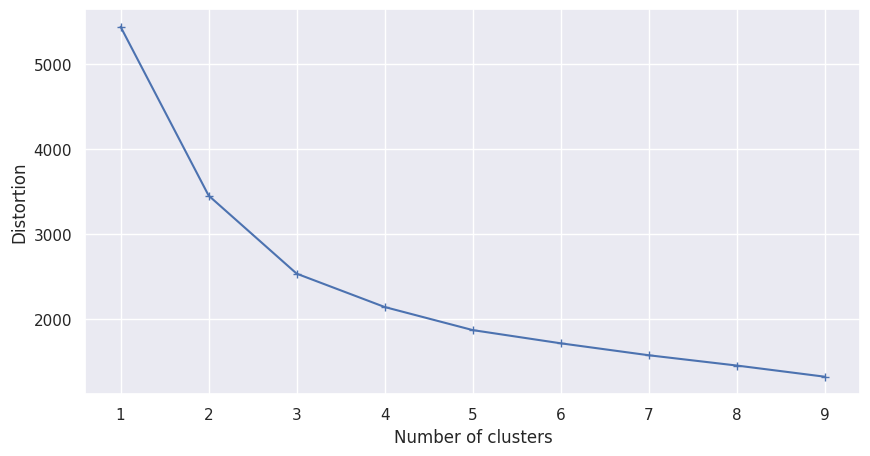

In [ ]:
dist_list=[]
for i in range(1,10):
  kmeans=KMeans(n_clusters=i,init='random',random_state=101)
  kmeans.fit(x)
  dist_list.append(kmeans.inertia_)

plt.figure(figsize=(10,5))
plt.plot(range(1,10),dist_list,marker='+')
plt.xlabel('Number of clusters')
plt.ylabel('Distortion')
plt.show()

Hasilnya menunjukkan kurva yang menurun seiring dengan bertambahnya jumlah cluster dan kemudian mendatar, membentuk "elbow". Titik "elbow", di mana tingkat penurunan berubah secara tajam, menunjukkan jumlah cluster yang optimal untuk data.

Berdasarkan hasil plot, dia menunjukkan penurunan tajam dalam distorsi (inersia) dengan jumlah cluster = 2, yang menunjukkan bahwa 2 cluster  merupakan jumlah yang optimal untuk dataset ini. Di luar titik ini, penurunan distorsi menjadi minimal, yang menunjukkan bahwa cluster tambahan tidak secara signifikan meningkatkan kecocokan model.

In [ ]:
kmeans = KMeans(n_clusters=2, init='k-means++', max_iter=300, n_init=10, random_state=0)
kmeans.fit_predict(x)

array([1, 1, 1, ..., 0, 0, 0], dtype=int32)

In [ ]:
x.columns

Index(['FAVC', 'FCVC', 'NCP', 'CAEC', 'family_history_with_overweight',
       'NObeyesdad'],
      dtype='object')

In [ ]:
data_selected = data_clean[['FAVC', 'FCVC', 'NCP', 'CAEC', 'family_history_with_overweight', 'NObeyesdad']]

In [ ]:
preds = kmeans.labels_
kmeans_df = pd.DataFrame(data_clean)
kmeans_df['KMeans_Clusters'] = preds
kmeans_df.head(10)

,Gender,Age,Height,Weight,family_history_with_overweight,FAVC,FCVC,NCP,CAEC,SMOKE,CH2O,SCC,FAF,TUE,CALC,MTRANS,NObeyesdad,BMI,KMeans_Clusters
0,0,21.0,1.62,64.0,1,0,1,2,2,0,2,0,1,1,3,3,1,24.386526,1
1,0,21.0,1.52,56.0,1,0,2,2,2,1,3,1,3,0,2,3,1,24.238227,1
2,1,23.0,1.80,77.0,1,0,1,2,2,0,2,0,2,1,1,3,1,23.765432,1
3,1,27.0,1.80,87.0,0,0,2,2,2,0,2,0,2,0,1,4,2,26.851852,0
4,1,22.0,1.78,89.8,0,0,1,0,2,0,2,0,1,0,2,3,2,28.342381,0
5,1,29.0,1.62,53.0,0,1,1,2,2,0,2,0,1,0,2,0,1,20.195092,1
6,0,23.0,1.50,55.0,1,1,2,2,2,0,2,0,1,0,2,2,1,24.444444,1
7,1,22.0,1.64,53.0,0,0,1,2,2,0,2,0,3,0,2,3,1,19.705532,1
8,1,24.0,1.78,64.0,1,1,2,2,2,0,2,0,1,1,1,3,1,20.199470,1
9,1,22.0,1.72,68.0,1,1,1,2,2,0,2,0,1,1,3,3,1,22.985398,1


## **Clustering dengan menggunakan variabel BMI, CAEC, family_history_with_overweight**

In [ ]:
import pandas as pd
import plotly.graph_objects as go
import plotly.express as px

kmeans_df["KMeans_Clusters"] = kmeans_df["KMeans_Clusters"].round().astype(int)

color_mapping = {
    0: 'blue',
    1: 'yellow'
}

# Save the cluster labels along with features to a CSV file
kmeans_df.to_csv('kmeans_result.csv', index=False)

# Choose 3 features for the 3D scatter plot (e.g., "CAEC", "BMI", "family_history_with_overweight")
feature_x = "CAEC"
feature_y = "BMI"
feature_z = "family_history_with_overweight"

# Additional features to include in hover data (customize as needed)
hover_features = ["CAEC", "BMI", "family_history_with_overweight"]

# Create 3D scatter plot with color-coded clusters
fig = px.scatter_3d(
    kmeans_df,
    x=feature_x,
    y=feature_y,
    z=feature_z,
    color="KMeans_Clusters",  # Assuming "KMeans_Clusters" is the cluster label column
    hover_data=hover_features,  # Show additional info on hover
    title="3D Visualization of Clusters (KMeans)",
    color_discrete_map = color_mapping
)

# Get centroids for each cluster
centroids = kmeans_df.groupby("KMeans_Clusters")[hover_features].mean().reset_index()

# Add centroids to the plot using go.Scatter3d
fig.add_trace(
    go.Scatter3d(
        x=centroids[feature_x],
        y=centroids[feature_y],
        z=centroids[feature_z],
        mode='markers',
        marker=dict(
            symbol='cross',  # Set symbol to cross
            size=10,  # Set size of markers
            color=centroids["KMeans_Clusters"],  # Color by cluster ID
            opacity=1,  # Set opacity
            showscale=False  # Show color scale legend
        ),
        hovertext=centroids["KMeans_Clusters"],  # Hover text with cluster label
        hoverinfo='text'  # Show hover text
    )
)



# Customize layout (optional)
fig.update_coloraxes(colorbar_tickvals=[0, 1, 2, 3, 4], colorbar_ticktext=[0, 1, 2, 3, 4])
fig.update_layout(width=900, height=600)
fig.update_layout(showlegend=False)  # Hide legend for the 3D plot

# Show the 3D scatter plot with centroids
fig.show()


In [ ]:
print(kmeans_df["KMeans_Clusters"].unique())

[1 0]


### Analisa data pada cluster 0:

* ### Mayoritas orang pada cluster 0 memiliki CAEC 2, yang berarti bahwa mereka terkadang memakan cemilan diluar makan berat sebanyak 3 kali.

* ### Mayoritas orang pada cluster 0 memiliki rentang BMI normal hingga overweight

* ### Mayoritas orang pada cluster 0 memiliki keluarga yang overweight

### Analisa data pada cluster 1:

* ### Data pada cluster 1 memiliki sebaran CAEC yang hampir sama pada setiap nilai. Hal ini mungkin mengindikasikan bahwa CAEC tidak bisa dijadikan karakteristik penentu pada cluster ini.

* ### Mayoritas orang pada cluster 1 memiliki rentang BMI dari underweight hingga normal.

* ### Data pada cluster 1 memiliki sebaran yang rata pada family_history_with_overweight.

In [ ]:
kmeans_df["KMeans_Clusters"] = kmeans_df["KMeans_Clusters"].round().astype(int)

color_mapping = {
    0: 'blue',
    1: 'yellow'
}

# Save the cluster labels along with features to a CSV file
kmeans_df.to_csv('kmeans_result.csv', index=False)

# Choose 3 features for the 3D scatter plot (e.g., "CAEC", "BMI", "family_history_with_overweight")
feature_x = "NCP"
feature_y = "FCVC"
feature_z = "FAVC"

# Additional features to include in hover data (customize as needed)
hover_features = ["NCP", "FCVC", "FAVC"]

# Create 3D scatter plot with color-coded clusters
fig = px.scatter_3d(
    kmeans_df,
    x=feature_x,
    y=feature_y,
    z=feature_z,
    color="KMeans_Clusters",  # Assuming "KMeans_Clusters" is the cluster label column
    hover_data=hover_features,  # Show additional info on hover
    title="3D Visualization of Clusters (KMeans)",
    color_discrete_map = color_mapping
)

# Get centroids for each cluster
centroids = kmeans_df.groupby("KMeans_Clusters")[hover_features].mean().reset_index()

# Add centroids to the plot using go.Scatter3d
fig.add_trace(
    go.Scatter3d(
        x=centroids[feature_x],
        y=centroids[feature_y],
        z=centroids[feature_z],
        mode='markers',
        marker=dict(
            symbol='cross',  # Set symbol to cross
            size=10,  # Set size of markers
            color=centroids["KMeans_Clusters"],  # Color by cluster ID
            opacity=1,  # Set opacity
            showscale=False  # Show color scale legend
        ),
        hovertext=centroids["KMeans_Clusters"],  # Hover text with cluster label
        hoverinfo='text'  # Show hover text
    )
)



# Customize layout (optional)
fig.update_coloraxes(colorbar_tickvals=[0, 1, 2, 3, 4], colorbar_ticktext=[0, 1, 2, 3, 4])
fig.update_layout(width=900, height=600)
fig.update_layout(showlegend=False)  # Hide legend for the 3D plot

# Show the 3D scatter plot with centroids
fig.show()


### Analisa data pada cluster 0:

* ### Data dalam cluster 0 memiliki FAVC dan FCVC 0, dan NCP 0 atau 3. Artinya, orang-orang pada cluster 0 tidak mengkonsumsi makanan berkalori tinggi maupun sayuran, namun mereka makan sebanyak 3 kali sehari.


### **Kesimpulan akhir dari hasil K-Means Clustering**

* ### Orang-orang dalam cluster 0 terkadang memakan cemilan diluar 3 kali makan utama, serta memiliki keluarga / kerabat yang overweight. Mereka juga tidak mengonsumsi makanan berkalori tinggi maupun sayuran. Mereka memiliki kategori BMI normal hingga overweight.

* ### Orang-orang dalam cluster 1 tidak memiliki pola khusus dalam CAEC, NCP, FAVC, FCVC, maupun famili_history_with_overweight. Namun, mereka memiliki rentang BMI dari underweight hingga normal

## **K-Modes Clustering**

In [ ]:
pip install kmodes

In [ ]:
from kmodes.kmodes import KModes

Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 1, iteration: 1/100, moves: 0, cost: 3642.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 2, iteration: 1/100, moves: 0, cost: 3642.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 3, iteration: 1/100, moves: 0, cost: 3642.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 4, iteration: 1/100, moves: 0, cost: 3642.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 5, iteration: 1/100, moves: 0, cost: 3642.0
Best run was number 1
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 1, iteration: 1/100, moves: 80, cost: 3360.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 2, iteration: 1/100, moves: 257, cost: 3247.0
Run 2, iteration: 2/100, moves: 0, cost: 3247.0
Init: initializing centroids
In

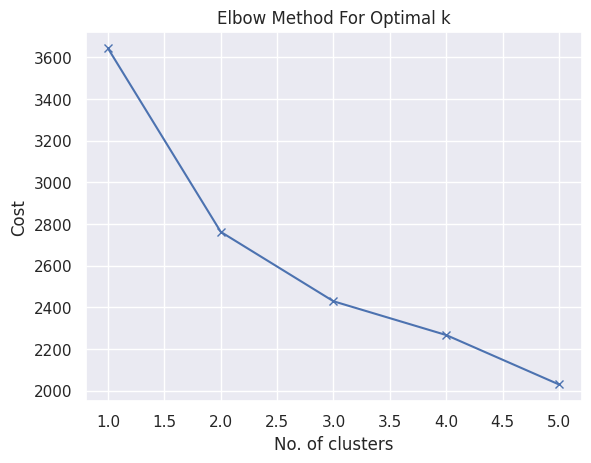

In [ ]:
# Elbow curve to find optimal K
cost = []
K = range(1,6)
for num_clusters in list(K):
    kmode = KModes(n_clusters=num_clusters, init = "random", n_init = 5, verbose=1)
    kmode.fit_predict(data_selected)
    cost.append(kmode.cost_)

plt.plot(K, cost, 'bx-')
plt.xlabel('No. of clusters')
plt.ylabel('Cost')
plt.title('Elbow Method For Optimal k')
plt.show()

### pada elbow curve diatas, tingkat penurunan cost menurun cukup signifikan pada number_of_clusters = 2. Sehingga jumlah cluster yang kami pilih adalah 2.

In [ ]:
# Building the model with 2 clusters
kmode = KModes(n_clusters=2, init = "random", n_init = 5, verbose=1)
clusters = kmode.fit_predict(data_selected)
clusters

Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 1, iteration: 1/100, moves: 712, cost: 2762.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 2, iteration: 1/100, moves: 100, cost: 3207.0
Run 2, iteration: 2/100, moves: 143, cost: 3207.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 3, iteration: 1/100, moves: 0, cost: 3357.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 4, iteration: 1/100, moves: 612, cost: 2762.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 5, iteration: 1/100, moves: 273, cost: 2882.0
Run 5, iteration: 2/100, moves: 402, cost: 2882.0
Best run was number 1


array([1, 0, 1, ..., 0, 0, 0], dtype=uint16)

In [ ]:
data_selected.insert(0, "Cluster", clusters, True)
data_selected

,Cluster,FAVC,FCVC,NCP,CAEC,family_history_with_overweight,NObeyesdad
0,1,0,1,2,2,1,1
1,0,0,2,2,2,1,1
2,1,0,1,2,2,1,1
3,0,0,2,2,2,0,2
4,1,0,1,0,2,0,2
...,...,...,...,...,...,...,...
2049,0,1,2,2,2,1,3
2050,0,1,2,2,2,1,3
2051,0,1,2,2,2,1,3
2052,0,1,2,2,2,1,3


## **Menampilkan data dalam cluster 0**

In [ ]:
cluster_0_data = data_selected.loc[data_selected["Cluster"] == 0]

# Define pandas display options for prettier output
pd.set_option('display.max_columns', None)  # Show all columns
pd.set_option('display.max_colwidth', 100)  # Set max column width
pd.set_option('display.precision', 3)  # Set precision for numerical data

# Print the data that belongs to cluster 0 using .to_string() method
print(cluster_0_data.to_string(index=False))

 Cluster  FAVC  FCVC  NCP  CAEC  family_history_with_overweight  NObeyesdad
       0     0     2    2     2                               1           1
       0     0     2    2     2                               0           2
       0     1     2    2     2                               1           1
       0     1     2    2     2                               1           1
       0     1     2    2     1                               1           3
       0     0     2    2     2                               0           1
       0     1     1    2     2                               0           3
       0     1     2    0     2                               1           1
       0     0     2    2     0                               1           1
       0     1     1    0     2                               0           3
       0     1     2    3     1                               1           2
       0     1     2    2     2                               1           1
       0    

In [ ]:
modes = cluster_0_data.mode().iloc[0]

# Define pandas display options for prettier output
pd.set_option('display.max_columns', None)  # Show all columns
pd.set_option('display.max_colwidth', 100)  # Set max column width
pd.set_option('display.precision', 3)  # Set precision for numerical data

# Display the modes in a readable format
print("Mode of each feature in cluster 0:")
print(modes.to_string(index=True))

Mode of each feature in cluster 0:
Cluster                           0
FAVC                              1
FCVC                              2
NCP                               2
CAEC                              2
family_history_with_overweight    1
NObeyesdad                        3


## **Analisa data pada cluster 0:**

* ### Mayoritas orang pada cluster 0 memiliki FAVC 1, yang artinya mereka sering mengonsumsi makanan berkalori tinggi

* ### Mayoritas orang pada cluster 0 memiliki FCVC 2, yang artinya mereka terkadang mengonsumsi sayur

* ### Mayoritas orang pada cluster 0 memiliki NCP 2, yang artinya mereka makan nasi 3 kali sehari

* ### Mayoritas orang pada cluster 0 memiliki CAEC 2, yang artinya mereka terkadang mengonsumsi cemilan diluar 3 kali makan utama

* ### Mayoritas orang pada cluster 0 memiliki kerabat yang overweight

* ### Mayoritas orang pada cluster 0 masuk dalam kategori obesitas

## **Menampilkan data dalam cluster 1**

In [ ]:
cluster_1_data = data_selected.loc[data_selected["Cluster"] == 1]

# Define pandas display options for prettier output
pd.set_option('display.max_columns', None)  # Show all columns
pd.set_option('display.max_colwidth', 100)  # Set max column width
pd.set_option('display.precision', 3)  # Set precision for numerical data

# Print the data that belongs to cluster 0 using .to_string() method
print(cluster_1_data.to_string(index=False))

 Cluster  FAVC  FCVC  NCP  CAEC  family_history_with_overweight  NObeyesdad
       1     0     1    2     2                               1           1
       1     0     1    2     2                               1           1
       1     0     1    0     2                               0           2
       1     1     1    2     2                               0           1
       1     0     1    2     2                               0           1
       1     1     1    2     2                               1           1
       1     1     1    2     1                               1           2
       1     1     1    0     2                               1           2
       1     0     1    0     2                               1           2
       1     0     1    2     2                               1           2
       1     1     1    2     2                               1           1
       1     0     1    3     1                               1           1
       1    

In [ ]:
modes = cluster_1_data.mode().iloc[0]

# Define pandas display options for prettier output
pd.set_option('display.max_columns', None)  # Show all columns
pd.set_option('display.max_colwidth', 100)  # Set max column width
pd.set_option('display.precision', 3)  # Set precision for numerical data

# Display the modes in a readable format
print("Mode of each feature in cluster 1:")
print(modes.to_string(index=True))

Mode of each feature in cluster 1:
Cluster                           1
FAVC                              1
FCVC                              1
NCP                               2
CAEC                              2
family_history_with_overweight    1
NObeyesdad                        2


## **Analisa data pada cluster 1:**

* ### Mayoritas orang pada cluster 1 memiliki FAVC 1, yang artinya mereka sering mengonsumsi makanan berkalori tinggi

* ### Mayoritas orang pada cluster 1 memiliki FCVC 1, yang artinya mereka todak pernah mengonsumsi sayur

* ### Mayoritas orang pada cluster 1 memiliki NCP 2, yang artinya mereka makan nasi 3 kali sehari

* ### Mayoritas orang pada cluster 1 memiliki CAEC 2, yang artinya mereka terkadang mengonsumsi cemilan diluar 3 kali makan utama

* ### Mayoritas orang pada cluster 1 memiliki kerabat yang overweight

* ### Mayoritas orang pada cluster 1 masuk dalam kategori overweight

## **Insight dari hasil K-Modes Clustering**

* ### Mengonsumsi makanan berkalori tinggi secara berlebihan dan sering memakan cemilan diluar makanan utama berpotensi membuat seseorang mengalami overweight hingga obesitas. Apalagi jika terdapat anggota keluarga / kerabat yang overweight, maka potensi seseorang untuk menjadi overweight / obesitas akan semakin tinggi.

* ### Selama ini kita mengetahui bahwa konsumsi sayur akan membawa dampak baik bagi tubuh. Namun, dari hasil clustering ini, dapat dilihat bahwa konsumsi sayur tidak akan mencegah terjadinya overweight / obesitas.

### Oleh karena itu, sangat penting untuk menjaga pola makan kita agar terhindar dari obesitas.

## **Kesimpulan Teknis**

### Berdasarkan percobaan yang kami lakukan, kami mendapati bahwa untuk melakukan clustering pada data kategorikal, metode K-Modes lebih cocok untuk menganalisa karakteristik data pada setiap cluster dibandingkan dengan metode K-Means.

### Hal tersebut juga didukung oleh referensi berikut ini:
### https://www.analyticsvidhya.com/blog/2021/06/kmodes-clustering-algorithm-for-categorical-data/